In [1]:
# import libraries
import numpy as np
import pandas as pd
import openpyxl
import seaborn as sns
import matplotlib.pyplot as plt
pd.set_option('display.max_columns', None)
from pathlib import Path


## Load Excel files

In [5]:

# Load Excel file
# Define directory path
data_file_path = Path("./All station data/")

# Initialize an empty list to collect DataFrames
all_dataframes = []

# Loop through all Excel files in the folder
for file in data_file_path.glob("*.xls"):
    # Load the Excel file
    excel_file = pd.ExcelFile(file)
    
    # Loop through all sheet names
    for sheet_name in excel_file.sheet_names:
        # Read the sheet into a DataFrame
        df = pd.read_excel(file, sheet_name=sheet_name)
        # Optional: add filename and sheet as columns for traceability
        df["source_file"] = file.name
        df["sheet_name"] = sheet_name
        
        # Append to list
        all_dataframes.append(df)

# Concatenate all into one big DataFrame
df_combined = pd.concat(all_dataframes, ignore_index=True)

# Inspect
print(df_combined.shape)
df_combined.head()




(708825, 17)


,Date,Location,Wind,Wind Dir,Temp,SO2,NO1,NO2,NOX,PM10,source_file,sheet_name,Pressure,PM2.5,Unnamed: 11,Unnamed: 12,Unnamed: 13
0,2005/01/01 00:00:00,Camden,3.80,80.5,18.4,1.03,0.047,2.02,2.08,36.9,2005-Cant Use.xls,Sheet0,NaN,NaN,NaN,NaN,NaN
1,2005/01/01 01:00:00,Camden,3.92,85.3,18.6,1.09,0.045,1.65,1.68,25.5,2005-Cant Use.xls,Sheet0,NaN,NaN,NaN,NaN,NaN
2,2005/01/01 02:00:00,Camden,3.80,84.9,18.2,1.18,0.048,1.52,1.55,18.1,2005-Cant Use.xls,Sheet0,NaN,NaN,NaN,NaN,NaN
3,2005/01/01 03:00:00,Camden,3.03,76.0,17.4,1.82,0.046,1.75,1.76,24.7,2005-Cant Use.xls,Sheet0,NaN,NaN,NaN,NaN,NaN
4,2005/01/01 04:00:00,Camden,2.37,95.5,16.8,1.75,0.042,1.69,1.69,30.5,2005-Cant Use.xls,Sheet0,NaN,NaN,NaN,NaN,NaN


In [6]:
df_combined.drop(columns=['Unnamed: 11', 'Unnamed: 12', 'Unnamed: 13', 'sheet_name'], inplace=True)

# Cleaned up time stamps

In [7]:
df_combined

,Date,Location,Wind,Wind Dir,Temp,SO2,NO1,NO2,NOX,PM10,source_file,Pressure,PM2.5
0,2005/01/01 00:00:00,Camden,3.800000,80.5000,18.40,1.030,0.047,2.02,2.08,36.90,2005-Cant Use.xls,NaN,NaN
1,2005/01/01 01:00:00,Camden,3.920000,85.3000,18.60,1.090,0.045,1.65,1.68,25.50,2005-Cant Use.xls,NaN,NaN
2,2005/01/01 02:00:00,Camden,3.800000,84.9000,18.20,1.180,0.048,1.52,1.55,18.10,2005-Cant Use.xls,NaN,NaN
3,2005/01/01 03:00:00,Camden,3.030000,76.0000,17.40,1.820,0.046,1.75,1.76,24.70,2005-Cant Use.xls,NaN,NaN
4,2005/01/01 04:00:00,Camden,2.370000,95.5000,16.80,1.750,0.042,1.69,1.69,30.50,2005-Cant Use.xls,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...
708820,2018/04/30 23:10:00,Phola,2.289117,118.9900,12.97,7.783,3.368,13.09,15.51,50.98,Phola data - 2017_April 2018.xls,857.0,NaN
708821,2018/04/30 23:20:00,Phola,1.657017,114.4888,12.80,8.730,2.433,12.86,14.22,45.25,Phola data - 2017_April 2018.xls,857.0,NaN
708822,2018/04/30 23:30:00,Phola,1.838153,102.8988,12.60,9.110,2.523,14.11,15.47,35.37,Phola data - 2017_April 2018.xls,857.0,NaN
708823,2018/04/30 23:40:00,Phola,1.570613,108.1560,12.44,7.694,3.402,13.16,15.60,36.79,Phola data - 2017_April 2018.xls,857.0,NaN


In [8]:

df_combined.dtypes

Date            object
Location        object
Wind           float64
Wind Dir       float64
Temp           float64
SO2            float64
NO1            float64
NO2            float64
NOX            float64
PM10           float64
source_file     object
Pressure       float64
PM2.5          float64
dtype: object

## Feature engineering: Extracting Month and Season from date column

In [11]:
df_combined['Month'] = pd.to_datetime(df_combined['Date'],format="mixed").dt.month

In [12]:
def get_season(month):
    if month in [12, 1, 2]:
        return 'Summer'
    elif month in [3, 4, 5]:
        return 'Autumn'
    elif month in [6, 7, 8]:
        return 'Winter'
    elif month in [9, 10, 11]:
        return 'Spring'

In [13]:
# Apply it to create a Season column
df_combined['Season'] = df_combined['Month'].apply(get_season)

df_combined

,Date,Location,Wind,Wind Dir,Temp,SO2,NO1,NO2,NOX,PM10,source_file,Pressure,PM2.5,Month,Season
0,2005/01/01 00:00:00,Camden,3.800000,80.5000,18.40,1.030,0.047,2.02,2.08,36.90,2005-Cant Use.xls,NaN,NaN,1.0,Summer
1,2005/01/01 01:00:00,Camden,3.920000,85.3000,18.60,1.090,0.045,1.65,1.68,25.50,2005-Cant Use.xls,NaN,NaN,1.0,Summer
2,2005/01/01 02:00:00,Camden,3.800000,84.9000,18.20,1.180,0.048,1.52,1.55,18.10,2005-Cant Use.xls,NaN,NaN,1.0,Summer
3,2005/01/01 03:00:00,Camden,3.030000,76.0000,17.40,1.820,0.046,1.75,1.76,24.70,2005-Cant Use.xls,NaN,NaN,1.0,Summer
4,2005/01/01 04:00:00,Camden,2.370000,95.5000,16.80,1.750,0.042,1.69,1.69,30.50,2005-Cant Use.xls,NaN,NaN,1.0,Summer
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
708820,2018/04/30 23:10:00,Phola,2.289117,118.9900,12.97,7.783,3.368,13.09,15.51,50.98,Phola data - 2017_April 2018.xls,857.0,NaN,4.0,Autumn
708821,2018/04/30 23:20:00,Phola,1.657017,114.4888,12.80,8.730,2.433,12.86,14.22,45.25,Phola data - 2017_April 2018.xls,857.0,NaN,4.0,Autumn
708822,2018/04/30 23:30:00,Phola,1.838153,102.8988,12.60,9.110,2.523,14.11,15.47,35.37,Phola data - 2017_April 2018.xls,857.0,NaN,4.0,Autumn
708823,2018/04/30 23:40:00,Phola,1.570613,108.1560,12.44,7.694,3.402,13.16,15.60,36.79,Phola data - 2017_April 2018.xls,857.0,NaN,4.0,Autumn


In [14]:
df_combined['wind_dir_rad'] = np.deg2rad(df_combined['Wind Dir'])
df_combined['wind_x'] = df_combined['Wind'] * np.sin(df_combined['wind_dir_rad'])
df_combined['wind_y'] = df_combined['Wind'] * np.cos(df_combined['wind_dir_rad'])

## Box plots to visualise data distribution

In [15]:
combined_station_data = df_combined.reset_index(drop=True)

In [16]:
df_combined.columns

Index(['Date', 'Location', 'Wind', 'Wind Dir', 'Temp', 'SO2', 'NO1', 'NO2',
       'NOX', 'PM10', 'source_file', 'Pressure', 'PM2.5', 'Month', 'Season',
       'wind_dir_rad', 'wind_x', 'wind_y'],
      dtype='object')

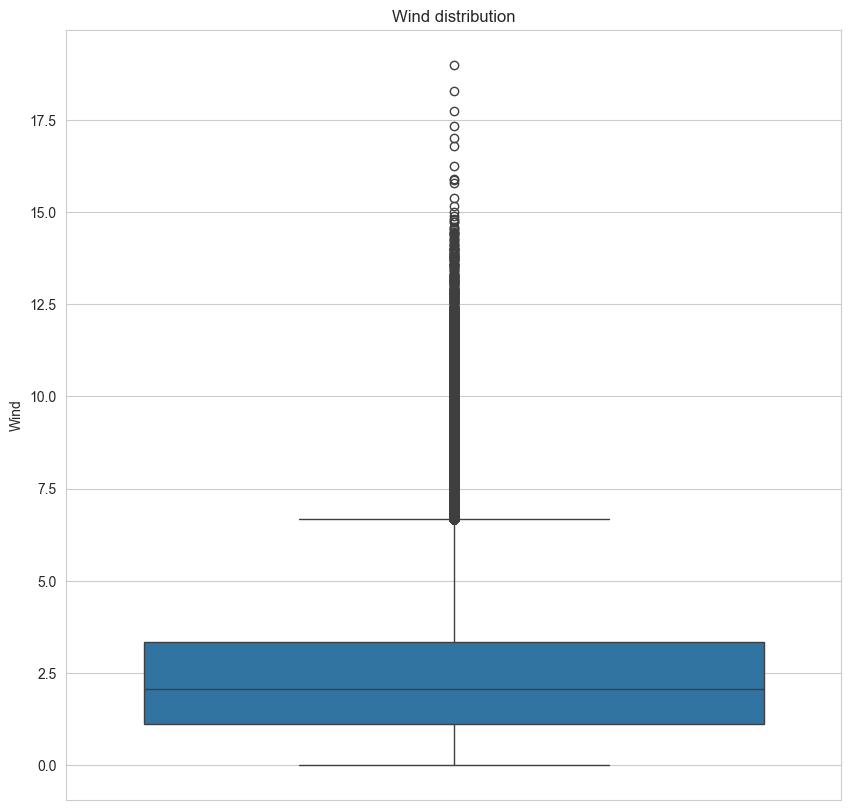

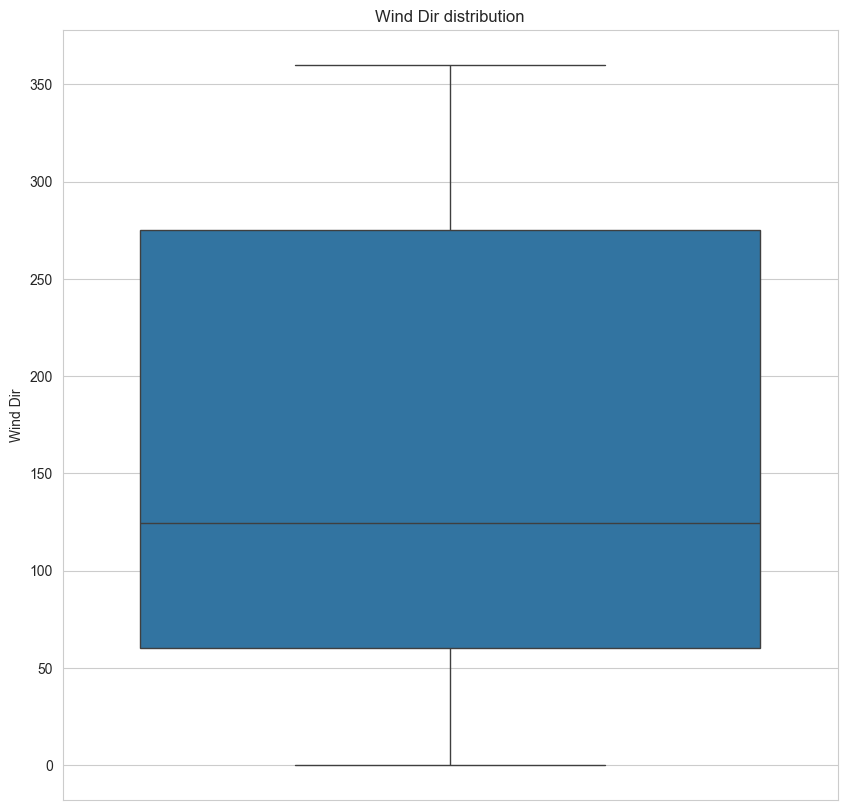

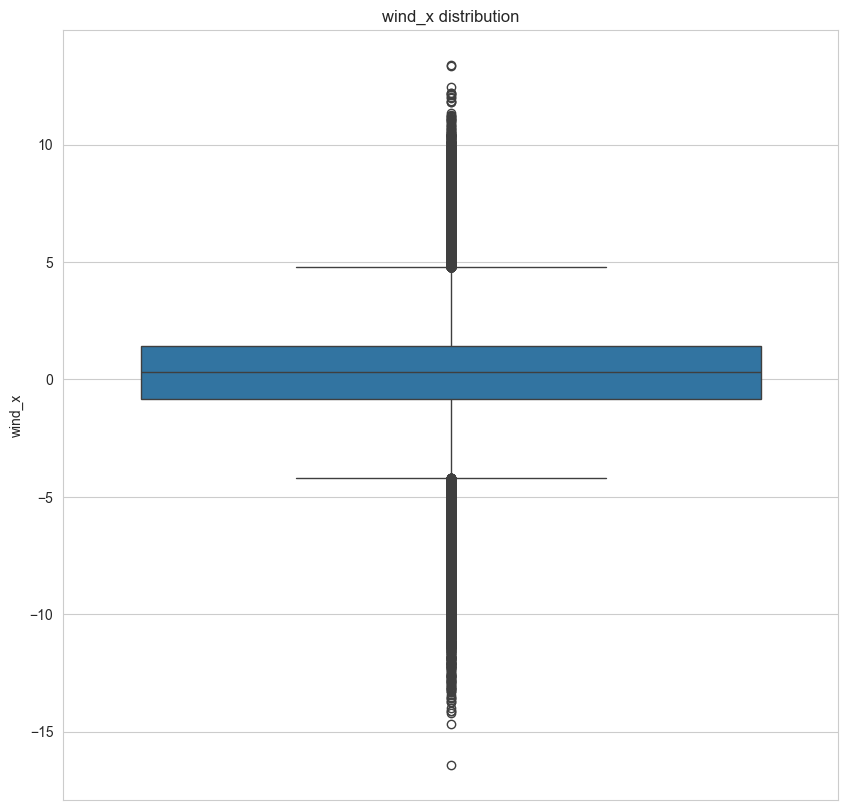

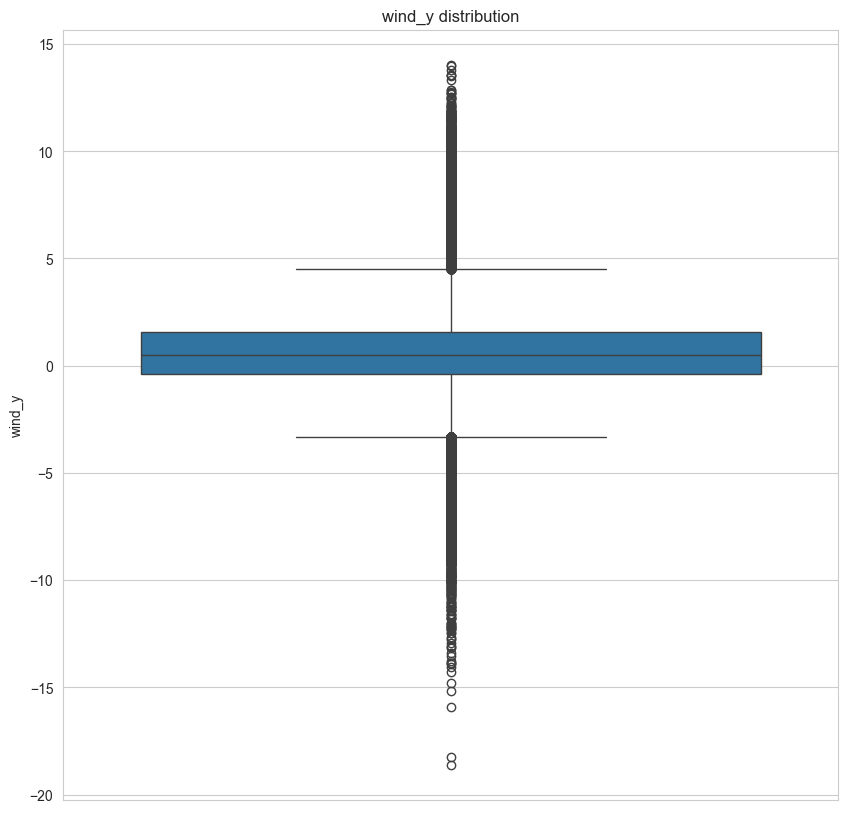

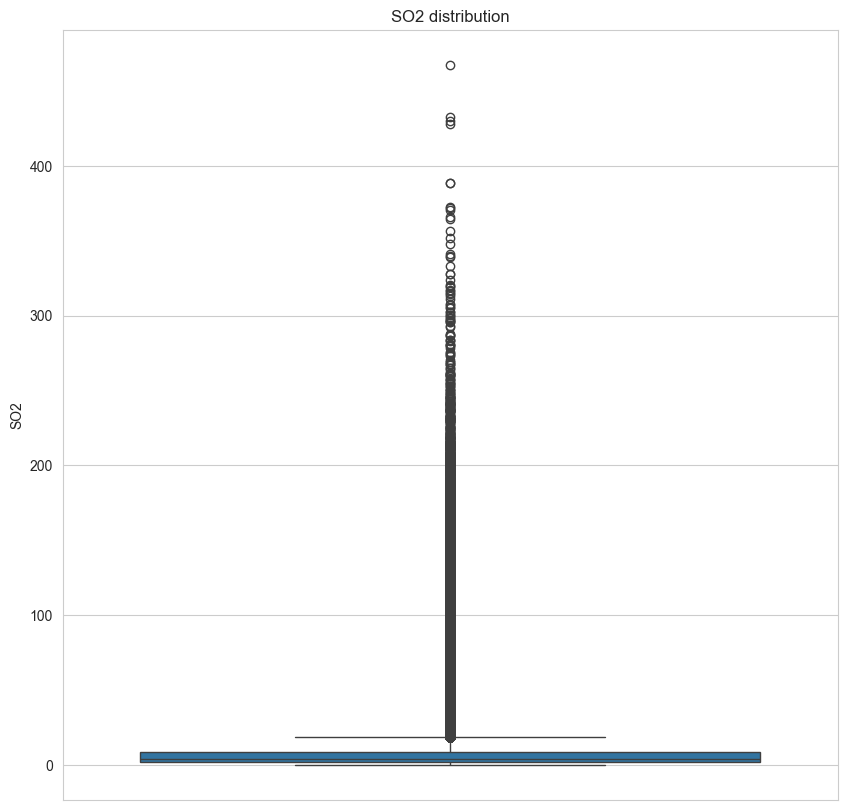

...

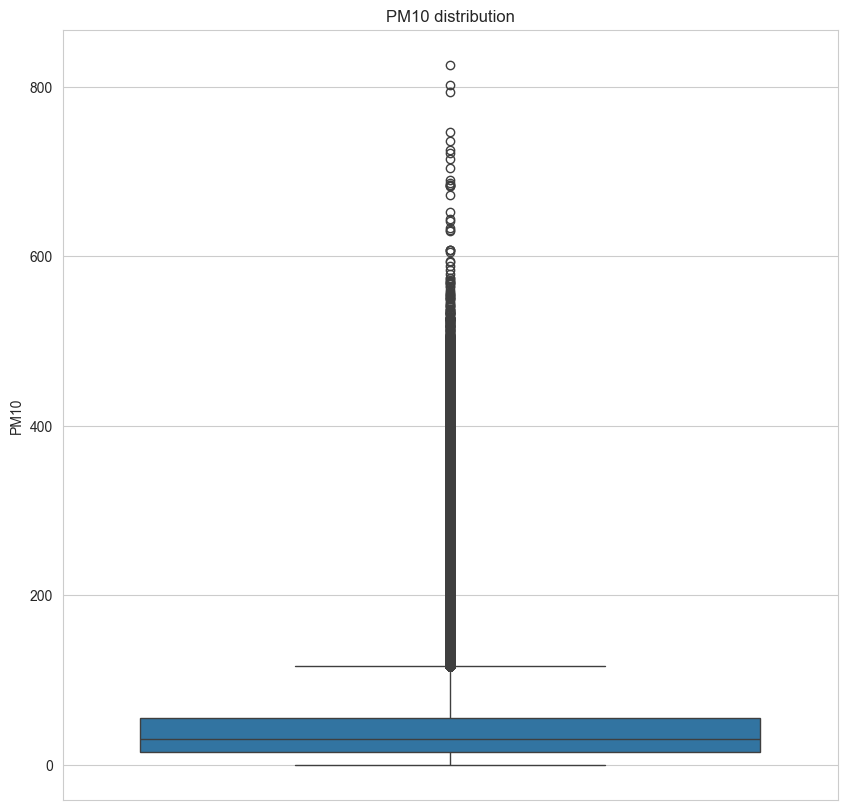

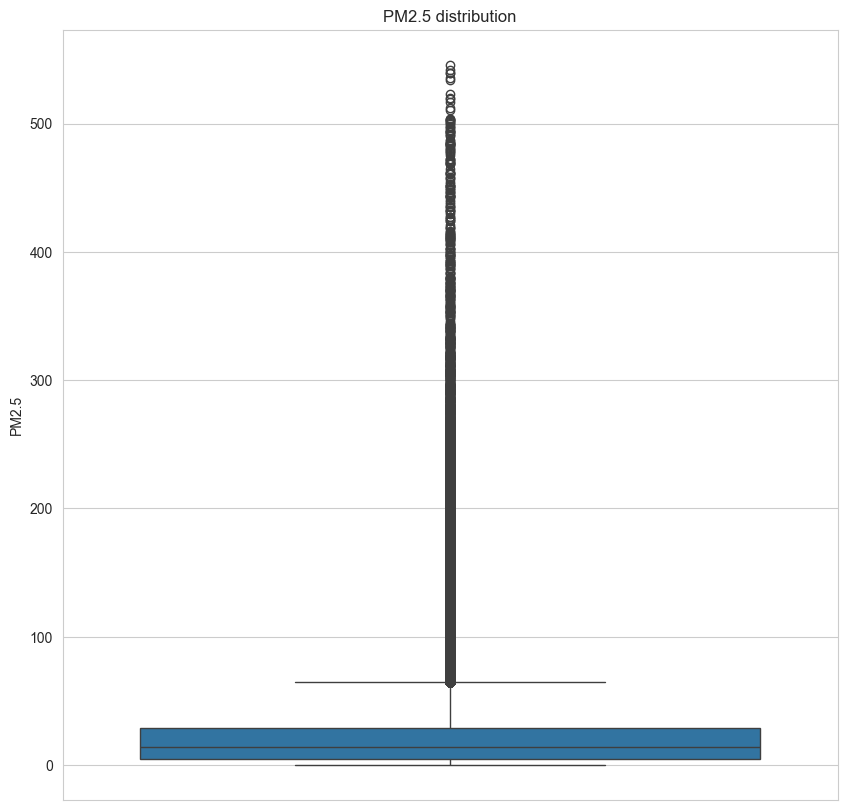

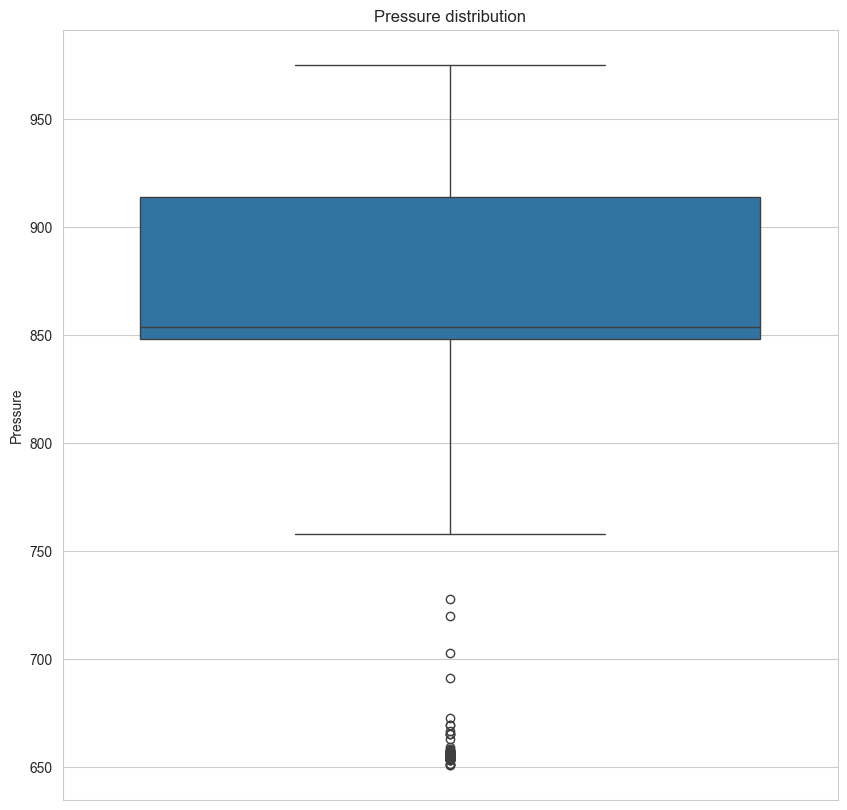

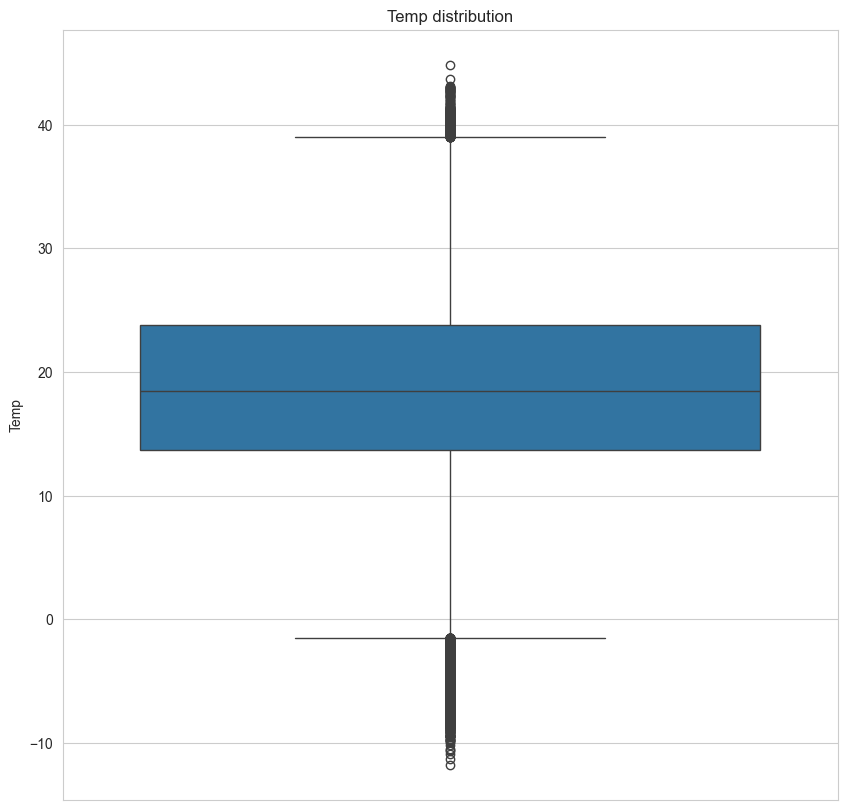

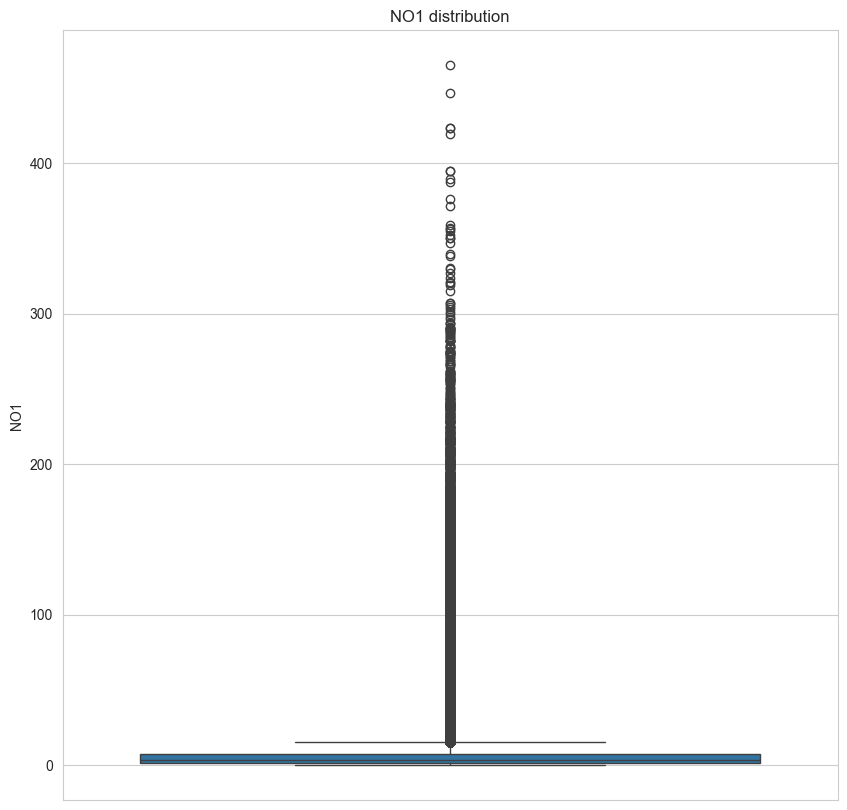

In [17]:
# List of numerical attributes
numerical_attributes = ['Wind', 'Wind Dir', 'wind_x', 'wind_y', 'SO2', 'NO2', 'NOX', 'PM10',
       'PM2.5', 'Pressure','Temp', 'NO1']

# Set style
sns.set_style('whitegrid')

# Create box plot for each of the attributes
for attribute in numerical_attributes:
    plt.figure(figsize=(10, 10))
    sns.boxplot(y=attribute, data=df_combined)
    plt.title(f'{attribute} distribution')
    plt.ylabel(attribute)
    plt.show()

## Too many outliers and extreme values, needs serious cleaning

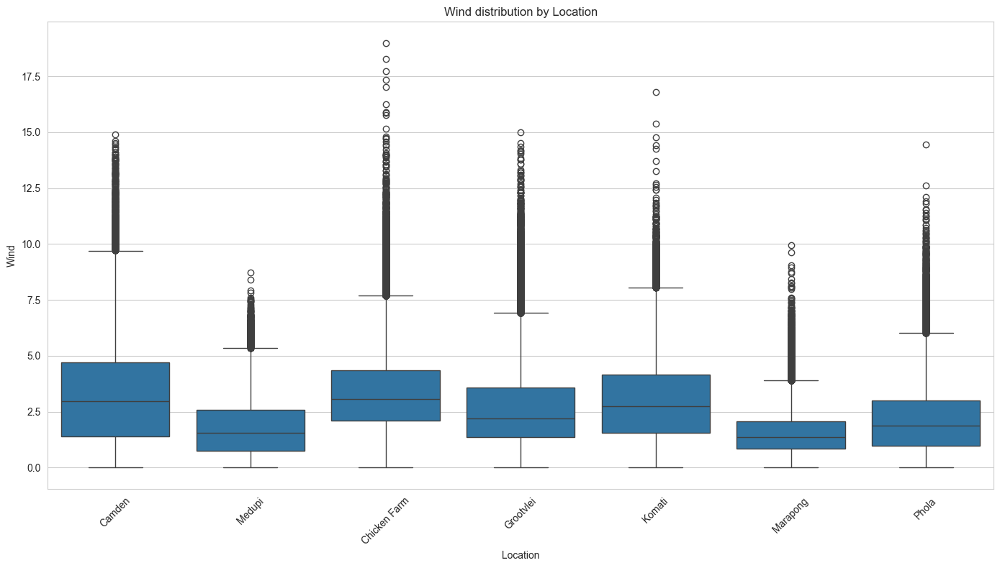

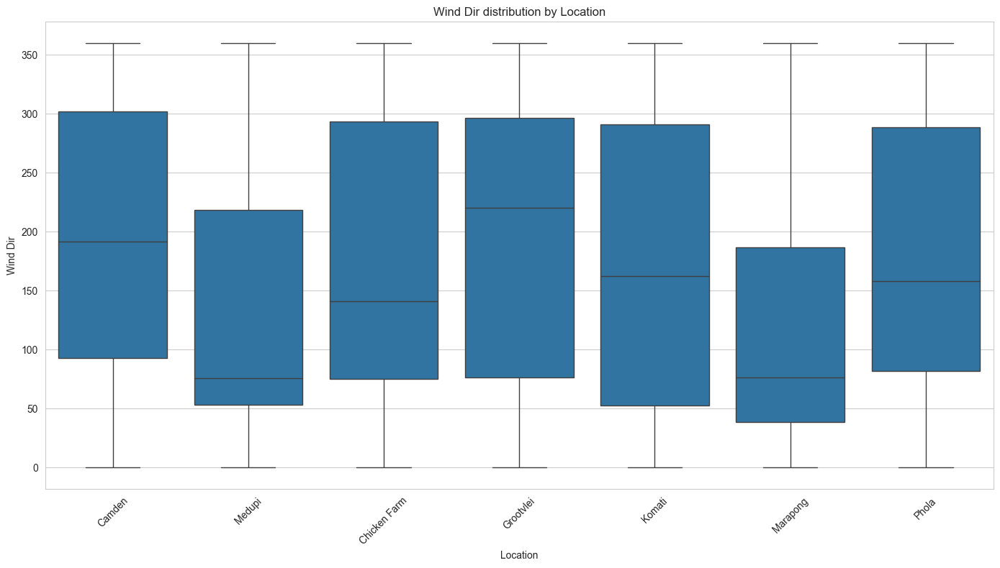

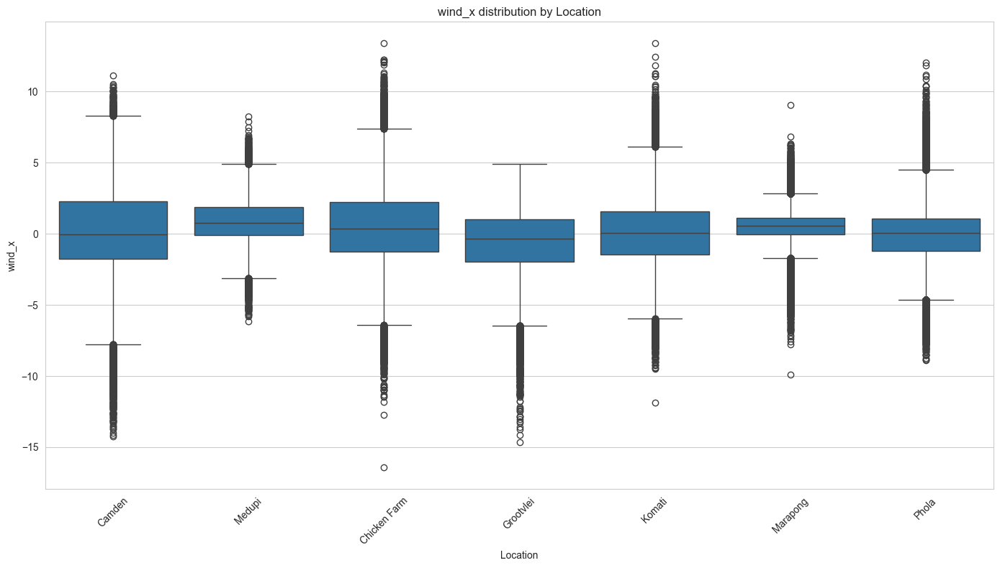

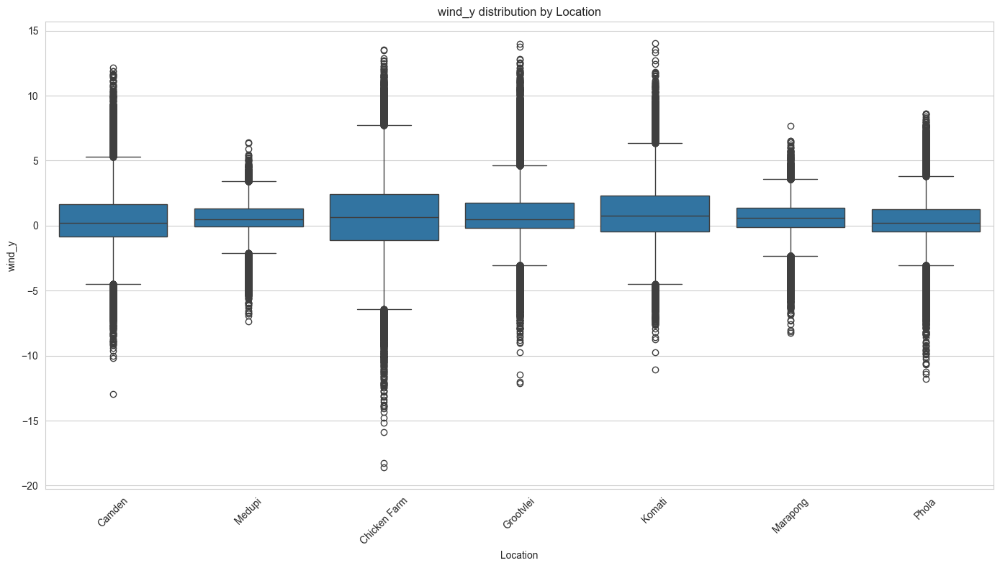

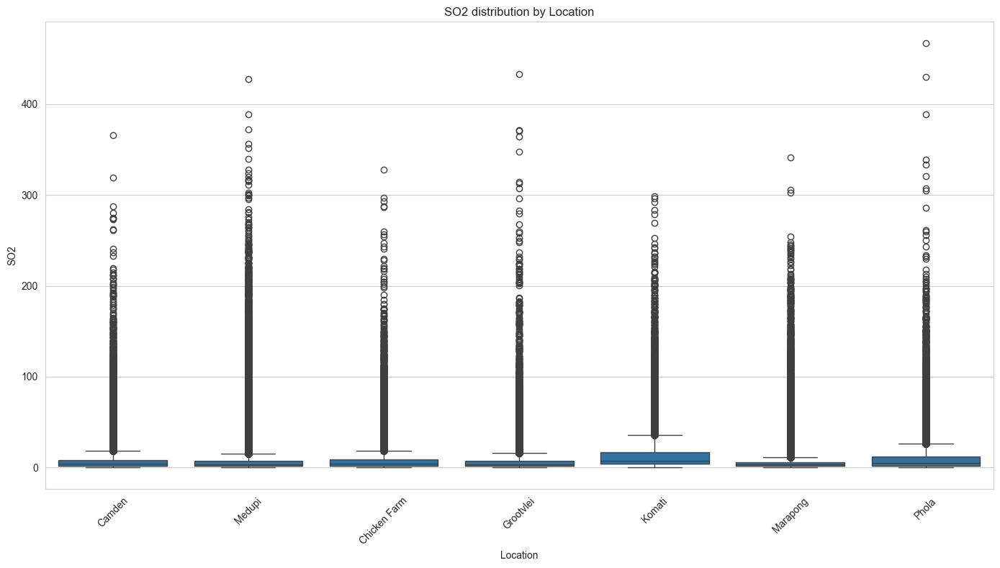

...

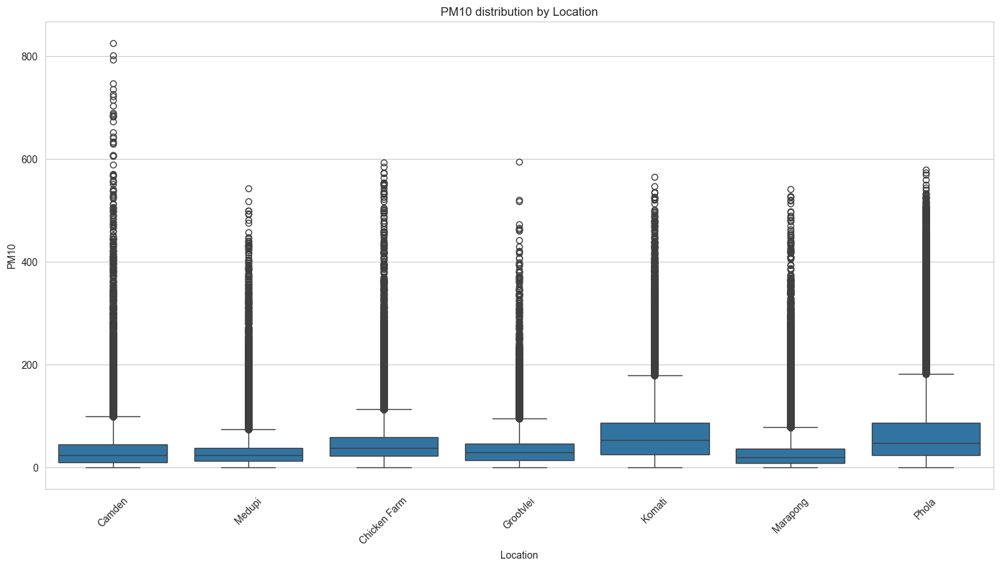

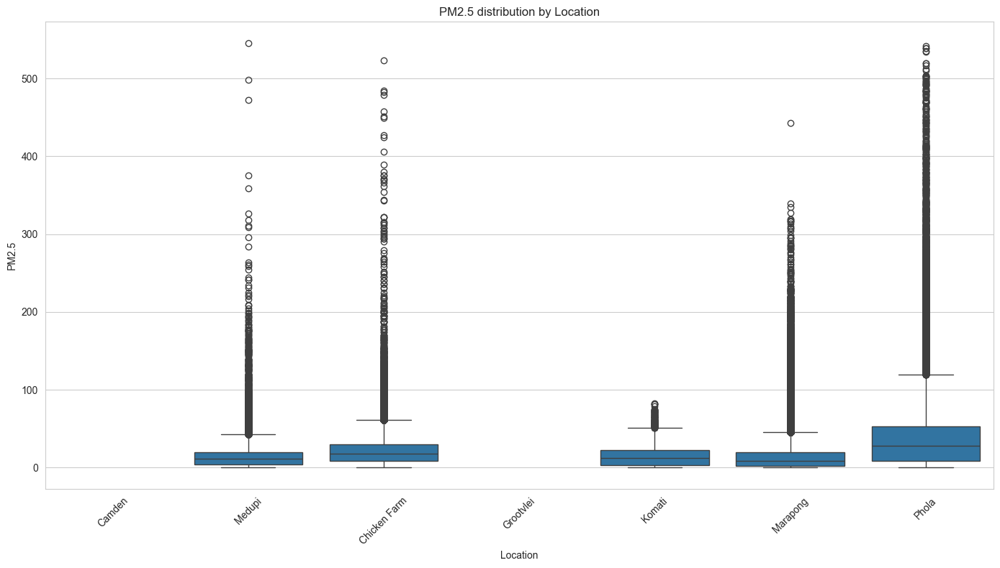

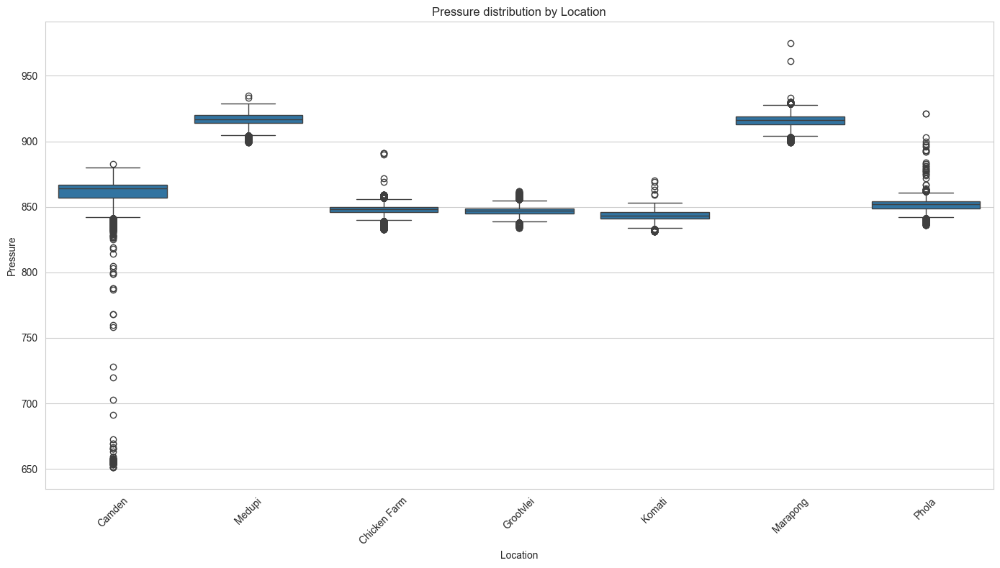

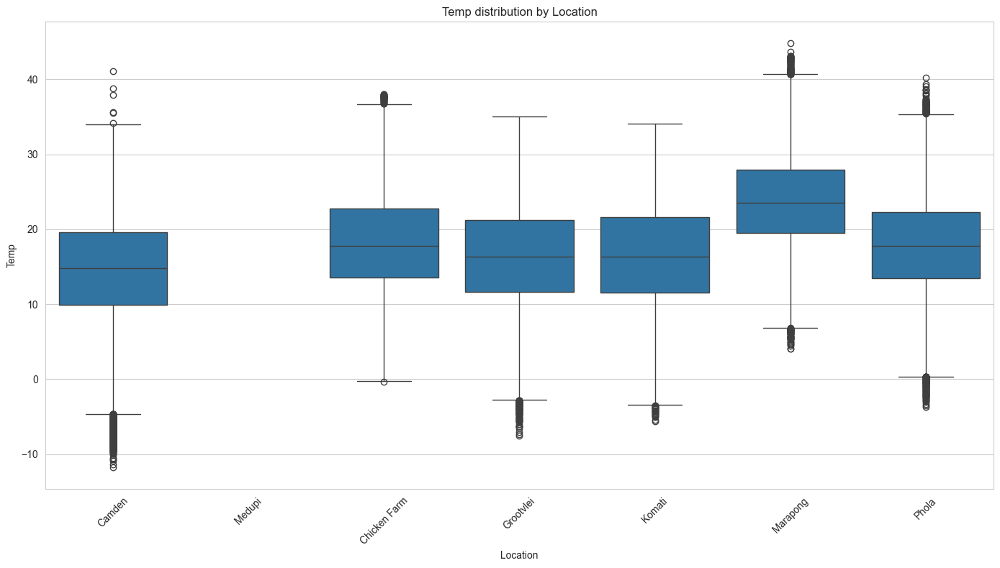

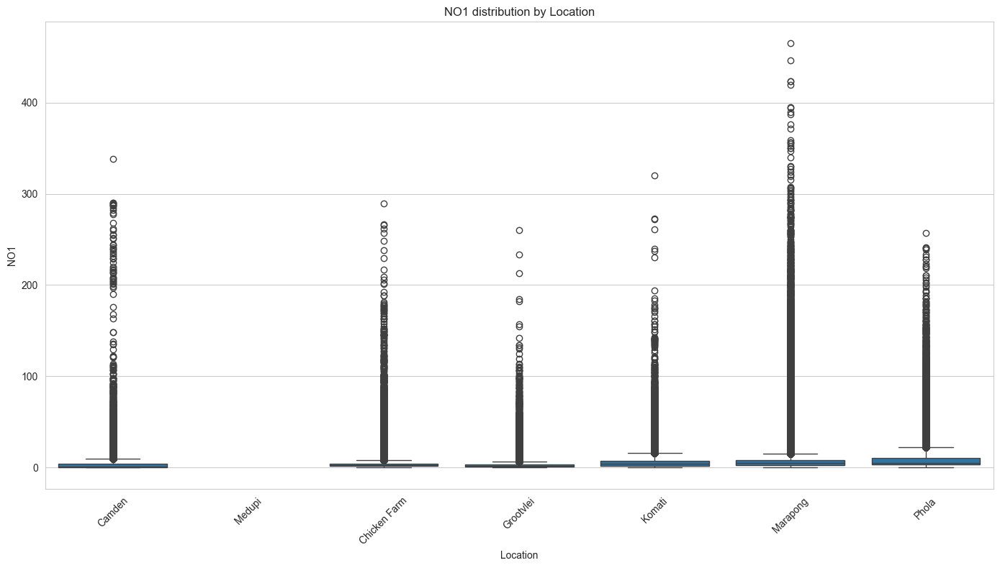

In [18]:
# Set style
sns.set_style('whitegrid')

# Create box plot for each attribute grouped by Location
for attribute in numerical_attributes:
    plt.figure(figsize=(14, 8))
    sns.boxplot(x='Location', y=attribute, data=df_combined)
    plt.title(f'{attribute} distribution by Location')
    plt.xticks(rotation=45)  # Rotate x-axis labels for better readability
    plt.ylabel(attribute)
    plt.xlabel('Location')
    plt.tight_layout()
    plt.show()


## Additional feature engineering and imputation

In [19]:
import pandas as pd
import numpy as np
from sklearn.ensemble import IsolationForest
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
import seaborn as sns



In [20]:
df_filtered = df_combined.copy()

In [21]:
df_filtered

,Date,Location,Wind,Wind Dir,Temp,SO2,NO1,NO2,NOX,PM10,source_file,Pressure,PM2.5,Month,Season,wind_dir_rad,wind_x,wind_y
0,2005/01/01 00:00:00,Camden,3.800000,80.5000,18.40,1.030,0.047,2.02,2.08,36.90,2005-Cant Use.xls,NaN,NaN,1.0,Summer,1.404990,3.747885,0.627181
1,2005/01/01 01:00:00,Camden,3.920000,85.3000,18.60,1.090,0.045,1.65,1.68,25.50,2005-Cant Use.xls,NaN,NaN,1.0,Summer,1.488766,3.906819,0.321199
2,2005/01/01 02:00:00,Camden,3.800000,84.9000,18.20,1.180,0.048,1.52,1.55,18.10,2005-Cant Use.xls,NaN,NaN,1.0,Summer,1.481785,3.784956,0.337798
3,2005/01/01 03:00:00,Camden,3.030000,76.0000,17.40,1.820,0.046,1.75,1.76,24.70,2005-Cant Use.xls,NaN,NaN,1.0,Summer,1.326450,2.939996,0.733023
4,2005/01/01 04:00:00,Camden,2.370000,95.5000,16.80,1.750,0.042,1.69,1.69,30.50,2005-Cant Use.xls,NaN,NaN,1.0,Summer,1.666789,2.359089,-0.227154
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
708820,2018/04/30 23:10:00,Phola,2.289117,118.9900,12.97,7.783,3.368,13.09,15.51,50.98,Phola data - 2017_April 2018.xls,857.0,NaN,4.0,Autumn,2.076767,2.002301,-1.109436
708821,2018/04/30 23:20:00,Phola,1.657017,114.4888,12.80,8.730,2.433,12.86,14.22,45.25,Phola data - 2017_April 2018.xls,857.0,NaN,4.0,Autumn,1.998207,1.507956,-0.686859
708822,2018/04/30 23:30:00,Phola,1.838153,102.8988,12.60,9.110,2.523,14.11,15.47,35.37,Phola data - 2017_April 2018.xls,857.0,NaN,4.0,Autumn,1.795923,1.791769,-0.410330
708823,2018/04/30 23:40:00,Phola,1.570613,108.1560,12.44,7.694,3.402,13.16,15.60,36.79,Phola data - 2017_April 2018.xls,857.0,NaN,4.0,Autumn,1.887678,1.492415,-0.489411


In [22]:
features = ['Wind', 'Wind Dir', 'SO2', 'NO2', 'NOX', 'PM10', 'wind_x', 'wind_y',
       'PM2.5', 'Pressure','Temp', 'NO1']
# Drop pollutants (features) with >80% missing values
# missing_pct_by_col = df_filtered[features].isna().mean()
# valid_features = missing_pct_by_col[missing_pct_by_col < 0.9].index.tolist()


In [16]:

# Drop locations with <3 pollutants measured
# valid_counts = df_filtered.groupby('Location')[valid_features].count()
# locations_with_enough_data = valid_counts[valid_counts.gt(0).sum(axis=1) >= 9].index


In [26]:

# Filter the DataFrame
#df_filtered = df_filtered[df_filtered['Location'].isin(locations_with_enough_data)]
df_filtered = df_filtered[['Date', 'Location', 'Season'] + features]

df_filtered['Date Time'] = pd.to_datetime(df_filtered['Date'], format='mixed')
df_filtered['Hour'] = df_filtered['Date Time'].dt.hour
df_filtered['Month'] = df_filtered['Date Time'].dt.month
df_filtered['DayOfWeek'] = df_filtered['Date Time'].dt.dayofweek
df_filtered['DayType'] = df_filtered['DayOfWeek'].apply(lambda x: 'Weekend' if x >= 5 else 'Weekday')




In [27]:
#df_filtered = df_filtered.dropna(subset=['PM2.5'])
df_filtered

,Date,Location,Season,Wind,Wind Dir,SO2,NO2,NOX,PM10,wind_x,wind_y,PM2.5,Pressure,Temp,NO1,Date Time,Hour,Month,DayOfWeek,DayType
0,2005/01/01 00:00:00,Camden,Summer,3.800000,80.5000,1.030,2.02,2.08,36.90,3.747885,0.627181,NaN,NaN,18.40,0.047,2005-01-01 00:00:00,0.0,1.0,5.0,Weekend
1,2005/01/01 01:00:00,Camden,Summer,3.920000,85.3000,1.090,1.65,1.68,25.50,3.906819,0.321199,NaN,NaN,18.60,0.045,2005-01-01 01:00:00,1.0,1.0,5.0,Weekend
2,2005/01/01 02:00:00,Camden,Summer,3.800000,84.9000,1.180,1.52,1.55,18.10,3.784956,0.337798,NaN,NaN,18.20,0.048,2005-01-01 02:00:00,2.0,1.0,5.0,Weekend
3,2005/01/01 03:00:00,Camden,Summer,3.030000,76.0000,1.820,1.75,1.76,24.70,2.939996,0.733023,NaN,NaN,17.40,0.046,2005-01-01 03:00:00,3.0,1.0,5.0,Weekend
4,2005/01/01 04:00:00,Camden,Summer,2.370000,95.5000,1.750,1.69,1.69,30.50,2.359089,-0.227154,NaN,NaN,16.80,0.042,2005-01-01 04:00:00,4.0,1.0,5.0,Weekend
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
708820,2018/04/30 23:10:00,Phola,Autumn,2.289117,118.9900,7.783,13.09,15.51,50.98,2.002301,-1.109436,NaN,857.0,12.97,3.368,2018-04-30 23:10:00,23.0,4.0,0.0,Weekday
708821,2018/04/30 23:20:00,Phola,Autumn,1.657017,114.4888,8.730,12.86,14.22,45.25,1.507956,-0.686859,NaN,857.0,12.80,2.433,2018-04-30 23:20:00,23.0,4.0,0.0,Weekday
708822,2018/04/30 23:30:00,Phola,Autumn,1.838153,102.8988,9.110,14.11,15.47,35.37,1.791769,-0.410330,NaN,857.0,12.60,2.523,2018-04-30 23:30:00,23.0,4.0,0.0,Weekday
708823,2018/04/30 23:40:00,Phola,Autumn,1.570613,108.1560,7.694,13.16,15.60,36.79,1.492415,-0.489411,NaN,857.0,12.44,3.402,2018-04-30 23:40:00,23.0,4.0,0.0,Weekday


## Next we will create additonal features that consists of the previous hours reading for that location as well as the rolling 3 hour average and standard deviation of that location at that time. This will give us an idea of whether there is a pollution event occuring or not.

In [28]:
#Creates a seperate column that consists of the previous hours reading
for feature in features:
    df_filtered[f'{feature}_lag1'] = df_filtered.groupby('Location')[feature].shift(1)

In [29]:
#Creates a new column using the 3 hour rolling average and std
windows = [3, 6, 12, 24]  # in hours

for feature in features:
    for window in windows:
        df_filtered[f'{feature}_roll{window}_mean'] = (
            df_filtered
            .groupby('Location')[feature]
            .transform(lambda x: x.rolling(window=window, min_periods=1).mean())
        )
        df_filtered[f'{feature}_roll{window}_std'] = (
            df_filtered
            .groupby('Location')[feature]
            .transform(lambda x: x.rolling(window=window, min_periods=1).std())
        )


C:\Users\Shivm\AppData\Local\Temp\ipykernel_2392\1373268521.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_filtered[f'{feature}_roll{window}_std'] = (
C:\Users\Shivm\AppData\Local\Temp\ipykernel_2392\1373268521.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_filtered[f'{feature}_roll{window}_mean'] = (
C:\Users\Shivm\AppData\Local\Temp\ipykernel_2392\1373268521.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  

In [21]:
df_filtered.columns

Index(['Date', 'Location', 'Season', 'Wind', 'Wind Dir', 'SO2', 'NO2', 'NOX',
       'PM10', 'PM2.5',
       ...
       'Temp_roll24_mean', 'Temp_roll24_std', 'NO1_roll3_mean',
       'NO1_roll3_std', 'NO1_roll6_mean', 'NO1_roll6_std', 'NO1_roll12_mean',
       'NO1_roll12_std', 'NO1_roll24_mean', 'NO1_roll24_std'],
      dtype='object', length=108)

In [23]:
# df_filtered['PM2.5_target_t_plus_24'] = (
#     df_filtered.sort_values(['Location', 'Date Time'])
#       .groupby('Location')['PM2.5 µg/m3']
#       .shift(-24)
# )

In [ ]:
def hierarchical_impute(df, columns, hierarchies):
    """
    Perform hierarchical median imputation for a list of columns,
    using a list of increasingly broad grouping levels.

    Parameters:
    -----------
    df : pd.DataFrame
        Your DataFrame containing missing values.

    columns : list
        List of feature/column names to impute.

    hierarchies : list of lists
        Each inner list defines a grouping level (e.g., ['Location', 'Hour', 'Season']).

    Returns:
    --------
    df : pd.DataFrame
        DataFrame with missing values filled.
    """
    df_imputed = df.copy()

    for col in columns:
        for group_cols in hierarchies:
            df_imputed[col] = df_imputed.groupby(group_cols)[col].transform(lambda x: x.fillna(x.median()))

        # Final fallback to global median
        df_imputed[col] = df_imputed[col].fillna(df_imputed[col].median())

    return df_imputed

In [ ]:
impute_hierarchies = [
    ['Location', 'Month', 'Season', 'DayOfWeek', 'DayType', 'Hour'],
    ['Location', 'Month', 'Season', 'DayOfWeek', 'DayType'],
    ['Location', 'Month', 'Season', 'DayOfWeek'],
    ['Location', 'Month', 'Season'],
    ['Location', 'Month'],
    ['Location']
]

#df_filtered = hierarchical_impute(df_filtered, valid_features, impute_hierarchies)

In [ ]:
#df_filtered.to_csv('Combined Station Data-without imputation.csv', index=False)

## End here for now

## Next we will implement an isolation forrest to identify anomalies in the data based on all the features we have from the original data plus the ones we have engineered.

In [30]:
from sklearn.preprocessing import OneHotEncoder

categorical_cols = ['Location', 'Season', 'DayType']
df_encoded = pd.get_dummies(df_filtered, columns=categorical_cols, drop_first=False)
df_model = df_encoded.copy()


In [31]:
df_encoded

,Date,Wind,Wind Dir,SO2,NO2,NOX,PM10,wind_x,wind_y,PM2.5,Pressure,Temp,NO1,Date Time,Hour,Month,DayOfWeek,Wind_lag1,Wind Dir_lag1,SO2_lag1,NO2_lag1,NOX_lag1,PM10_lag1,wind_x_lag1,wind_y_lag1,PM2.5_lag1,Pressure_lag1,Temp_lag1,NO1_lag1,Wind_roll3_mean,Wind_roll3_std,Wind_roll6_mean,Wind_roll6_std,Wind_roll12_mean,Wind_roll12_std,Wind_roll24_mean,Wind_roll24_std,Wind Dir_roll3_mean,Wind Dir_roll3_std,Wind Dir_roll6_mean,Wind Dir_roll6_std,Wind Dir_roll12_mean,Wind Dir_roll12_std,Wind Dir_roll24_mean,Wind Dir_roll24_std,SO2_roll3_mean,SO2_roll3_std,SO2_roll6_mean,SO2_roll6_std,SO2_roll12_mean,SO2_roll12_std,SO2_roll24_mean,SO2_roll24_std,NO2_roll3_mean,NO2_roll3_std,NO2_roll6_mean,NO2_roll6_std,NO2_roll12_mean,NO2_roll12_std,NO2_roll24_mean,NO2_roll24_std,NOX_roll3_mean,NOX_roll3_std,NOX_roll6_mean,NOX_roll6_std,NOX_roll12_mean,NOX_roll12_std,NOX_roll24_mean,NOX_roll24_std,PM10_roll3_mean,PM10_roll3_std,PM10_roll6_mean,PM10_roll6_std,PM10_roll12_mean,PM10_roll12_std,PM10_roll24_mean,PM10_roll24_std,wind_x_roll3_mean,wind_x_roll3_std,wind_x_roll6_mean,wind_x_roll6_std,wind_x_roll12_mean,wind_x_roll12_std,wind_x_roll24_mean,wind_x_roll24_std,wind_y_roll3_mean,wind_y_roll3_std,wind_y_roll6_mean,wind_y_roll6_std,wind_y_roll12_mean,wind_y_roll12_std,wind_y_roll24_mean,wind_y_roll24_std,PM2.5_roll3_mean,PM2.5_roll3_std,PM2.5_roll6_mean,PM2.5_roll6_std,PM2.5_roll12_mean,PM2.5_roll12_std,PM2.5_roll24_mean,PM2.5_roll24_std,Pressure_roll3_mean,Pressure_roll3_std,Pressure_roll6_mean,Pressure_roll6_std,Pressure_roll12_mean,Pressure_roll12_std,Pressure_roll24_mean,Pressure_roll24_std,Temp_roll3_mean,Temp_roll3_std,Temp_roll6_mean,Temp_roll6_std,Temp_roll12_mean,Temp_roll12_std,Temp_roll24_mean,Temp_roll24_std,NO1_roll3_mean,NO1_roll3_std,NO1_roll6_mean,NO1_roll6_std,NO1_roll12_mean,NO1_roll12_std,NO1_roll24_mean,NO1_roll24_std,Location_Camden,Location_Chicken Farm,Location_Grootvlei,Location_Komati,Location_Marapong,Location_Medupi,Location_Phola,Season_Autumn,Season_Spring,Season_Summer,Season_Winter,DayType_Weekday,DayType_Weekend
0,2005/01/01 00:00:00,3.800000,80.5000,1.030,2.02,2.08,36.90,3.747885,0.627181,NaN,NaN,18.40,0.047,2005-01-01 00:00:00,0.0,1.0,5.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.800000,NaN,3.800000,NaN,3.800000,NaN,3.800000,NaN,80.500000,NaN,80.500000,NaN,80.500000,NaN,80.500000,NaN,1.030000,NaN,1.030000,NaN,1.030000,NaN,1.030000,NaN,2.020000,NaN,2.020000,NaN,2.020000,NaN,2.020000,NaN,2.080000,NaN,2.080000,NaN,2.080000,NaN,2.080000,NaN,36.900000,NaN,36.900000,NaN,36.900000,NaN,36.900000,NaN,3.747885,NaN,3.747885,NaN,3.747885,NaN,3.747885,NaN,0.627181,NaN,0.627181,NaN,0.627181,NaN,0.627181,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,18.400000,NaN,18.400000,NaN,18.400000,NaN,18.400000,NaN,0.047000,NaN,0.047000,NaN,0.047000,NaN,0.047000,NaN,True,False,False,False,False,False,False,False,False,True,False,False,True
1,2005/01/01 01:00:00,3.920000,85.3000,1.090,1.65,1.68,25.50,3.906819,0.321199,NaN,NaN,18.60,0.045,2005-01-01 01:00:00,1.0,1.0,5.0,3.800000,80.5000,1.030,2.02,2.08,36.90,3.747885,0.627181,NaN,NaN,18.40,0.047,3.860000,0.084853,3.860000,0.084853,3.860000,0.084853,3.860000,0.084853,82.900000,3.394113,82.900000,3.394113,82.900000,3.394113,82.900000,3.394113,1.060000,0.042426,1.060000,0.042426,1.060000,0.042426,1.060000,0.042426,1.835000,0.261630,1.835000,0.261630,1.835000,0.261630,1.835000,0.261630,1.880000,0.282843,1.880000,0.282843,1.880000,0.282843,1.880000,0.282843,31.200000,8.061017,31.200000,8.061017,31.200000,8.061017,31.200000,8.061017,3.827352,0.112383,3.827352,0.112383,3.827352,0.112383,3.827352,0.112383,0.474190,0.216362,0.474190,0.216362,0.474190,0.216362,0.474190,0.216362,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,18.500000,0.141421,18.500000,0.141421,18.500000,0.141421,18.500000,0.141421,0.046000,0.001414,0.046000,0.001414,0.046000,0.001414,0.046000,0.001414,True,False,False,False,False,False,False,False,False,True,False,False,True
2,2005/01/01 02:00

In [32]:
df_model[df_model.isna().any(axis=1)]

,Date,Wind,Wind Dir,SO2,NO2,NOX,PM10,wind_x,wind_y,PM2.5,Pressure,Temp,NO1,Date Time,Hour,Month,DayOfWeek,Wind_lag1,Wind Dir_lag1,SO2_lag1,NO2_lag1,NOX_lag1,PM10_lag1,wind_x_lag1,wind_y_lag1,PM2.5_lag1,Pressure_lag1,Temp_lag1,NO1_lag1,Wind_roll3_mean,Wind_roll3_std,Wind_roll6_mean,Wind_roll6_std,Wind_roll12_mean,Wind_roll12_std,Wind_roll24_mean,Wind_roll24_std,Wind Dir_roll3_mean,Wind Dir_roll3_std,Wind Dir_roll6_mean,Wind Dir_roll6_std,Wind Dir_roll12_mean,Wind Dir_roll12_std,Wind Dir_roll24_mean,Wind Dir_roll24_std,SO2_roll3_mean,SO2_roll3_std,SO2_roll6_mean,SO2_roll6_std,SO2_roll12_mean,SO2_roll12_std,SO2_roll24_mean,SO2_roll24_std,NO2_roll3_mean,NO2_roll3_std,NO2_roll6_mean,NO2_roll6_std,NO2_roll12_mean,NO2_roll12_std,NO2_roll24_mean,NO2_roll24_std,NOX_roll3_mean,NOX_roll3_std,NOX_roll6_mean,NOX_roll6_std,NOX_roll12_mean,NOX_roll12_std,NOX_roll24_mean,NOX_roll24_std,PM10_roll3_mean,PM10_roll3_std,PM10_roll6_mean,PM10_roll6_std,PM10_roll12_mean,PM10_roll12_std,PM10_roll24_mean,PM10_roll24_std,wind_x_roll3_mean,wind_x_roll3_std,wind_x_roll6_mean,wind_x_roll6_std,wind_x_roll12_mean,wind_x_roll12_std,wind_x_roll24_mean,wind_x_roll24_std,wind_y_roll3_mean,wind_y_roll3_std,wind_y_roll6_mean,wind_y_roll6_std,wind_y_roll12_mean,wind_y_roll12_std,wind_y_roll24_mean,wind_y_roll24_std,PM2.5_roll3_mean,PM2.5_roll3_std,PM2.5_roll6_mean,PM2.5_roll6_std,PM2.5_roll12_mean,PM2.5_roll12_std,PM2.5_roll24_mean,PM2.5_roll24_std,Pressure_roll3_mean,Pressure_roll3_std,Pressure_roll6_mean,Pressure_roll6_std,Pressure_roll12_mean,Pressure_roll12_std,Pressure_roll24_mean,Pressure_roll24_std,Temp_roll3_mean,Temp_roll3_std,Temp_roll6_mean,Temp_roll6_std,Temp_roll12_mean,Temp_roll12_std,Temp_roll24_mean,Temp_roll24_std,NO1_roll3_mean,NO1_roll3_std,NO1_roll6_mean,NO1_roll6_std,NO1_roll12_mean,NO1_roll12_std,NO1_roll24_mean,NO1_roll24_std,Location_Camden,Location_Chicken Farm,Location_Grootvlei,Location_Komati,Location_Marapong,Location_Medupi,Location_Phola,Season_Autumn,Season_Spring,Season_Summer,Season_Winter,DayType_Weekday,DayType_Weekend
0,2005/01/01 00:00:00,3.800000,80.5000,1.030,2.02,2.08,36.90,3.747885,0.627181,NaN,NaN,18.40,0.047,2005-01-01 00:00:00,0.0,1.0,5.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.800000,NaN,3.800000,NaN,3.800000,NaN,3.800000,NaN,80.500000,NaN,80.500000,NaN,80.500000,NaN,80.500000,NaN,1.030000,NaN,1.030000,NaN,1.030000,NaN,1.030000,NaN,2.020000,NaN,2.020000,NaN,2.020000,NaN,2.020000,NaN,2.080000,NaN,2.080000,NaN,2.080000,NaN,2.080000,NaN,36.900000,NaN,36.900000,NaN,36.900000,NaN,36.900000,NaN,3.747885,NaN,3.747885,NaN,3.747885,NaN,3.747885,NaN,0.627181,NaN,0.627181,NaN,0.627181,NaN,0.627181,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,18.400000,NaN,18.400000,NaN,18.400000,NaN,18.400000,NaN,0.047000,NaN,0.047000,NaN,0.047000,NaN,0.047000,NaN,True,False,False,False,False,False,False,False,False,True,False,False,True
1,2005/01/01 01:00:00,3.920000,85.3000,1.090,1.65,1.68,25.50,3.906819,0.321199,NaN,NaN,18.60,0.045,2005-01-01 01:00:00,1.0,1.0,5.0,3.800000,80.5000,1.030,2.02,2.08,36.90,3.747885,0.627181,NaN,NaN,18.40,0.047,3.860000,0.084853,3.860000,0.084853,3.860000,0.084853,3.860000,0.084853,82.900000,3.394113,82.900000,3.394113,82.900000,3.394113,82.900000,3.394113,1.060000,0.042426,1.060000,0.042426,1.060000,0.042426,1.060000,0.042426,1.835000,0.261630,1.835000,0.261630,1.835000,0.261630,1.835000,0.261630,1.880000,0.282843,1.880000,0.282843,1.880000,0.282843,1.880000,0.282843,31.200000,8.061017,31.200000,8.061017,31.200000,8.061017,31.200000,8.061017,3.827352,0.112383,3.827352,0.112383,3.827352,0.112383,3.827352,0.112383,0.474190,0.216362,0.474190,0.216362,0.474190,0.216362,0.474190,0.216362,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,18.500000,0.141421,18.500000,0.141421,18.500000,0.141421,18.500000,0.141421,0.046000,0.001414,0.046000,0.001414,0.046000,0.001414,0.046000,0.001414,True,False,False,False,False,False,False,False,False,True,False,False,True
2,2005/01/01 02:00

In [33]:
df_cleaned = df_model#.dropna()
df_cleaned

,Date,Wind,Wind Dir,SO2,NO2,NOX,PM10,wind_x,wind_y,PM2.5,Pressure,Temp,NO1,Date Time,Hour,Month,DayOfWeek,Wind_lag1,Wind Dir_lag1,SO2_lag1,NO2_lag1,NOX_lag1,PM10_lag1,wind_x_lag1,wind_y_lag1,PM2.5_lag1,Pressure_lag1,Temp_lag1,NO1_lag1,Wind_roll3_mean,Wind_roll3_std,Wind_roll6_mean,Wind_roll6_std,Wind_roll12_mean,Wind_roll12_std,Wind_roll24_mean,Wind_roll24_std,Wind Dir_roll3_mean,Wind Dir_roll3_std,Wind Dir_roll6_mean,Wind Dir_roll6_std,Wind Dir_roll12_mean,Wind Dir_roll12_std,Wind Dir_roll24_mean,Wind Dir_roll24_std,SO2_roll3_mean,SO2_roll3_std,SO2_roll6_mean,SO2_roll6_std,SO2_roll12_mean,SO2_roll12_std,SO2_roll24_mean,SO2_roll24_std,NO2_roll3_mean,NO2_roll3_std,NO2_roll6_mean,NO2_roll6_std,NO2_roll12_mean,NO2_roll12_std,NO2_roll24_mean,NO2_roll24_std,NOX_roll3_mean,NOX_roll3_std,NOX_roll6_mean,NOX_roll6_std,NOX_roll12_mean,NOX_roll12_std,NOX_roll24_mean,NOX_roll24_std,PM10_roll3_mean,PM10_roll3_std,PM10_roll6_mean,PM10_roll6_std,PM10_roll12_mean,PM10_roll12_std,PM10_roll24_mean,PM10_roll24_std,wind_x_roll3_mean,wind_x_roll3_std,wind_x_roll6_mean,wind_x_roll6_std,wind_x_roll12_mean,wind_x_roll12_std,wind_x_roll24_mean,wind_x_roll24_std,wind_y_roll3_mean,wind_y_roll3_std,wind_y_roll6_mean,wind_y_roll6_std,wind_y_roll12_mean,wind_y_roll12_std,wind_y_roll24_mean,wind_y_roll24_std,PM2.5_roll3_mean,PM2.5_roll3_std,PM2.5_roll6_mean,PM2.5_roll6_std,PM2.5_roll12_mean,PM2.5_roll12_std,PM2.5_roll24_mean,PM2.5_roll24_std,Pressure_roll3_mean,Pressure_roll3_std,Pressure_roll6_mean,Pressure_roll6_std,Pressure_roll12_mean,Pressure_roll12_std,Pressure_roll24_mean,Pressure_roll24_std,Temp_roll3_mean,Temp_roll3_std,Temp_roll6_mean,Temp_roll6_std,Temp_roll12_mean,Temp_roll12_std,Temp_roll24_mean,Temp_roll24_std,NO1_roll3_mean,NO1_roll3_std,NO1_roll6_mean,NO1_roll6_std,NO1_roll12_mean,NO1_roll12_std,NO1_roll24_mean,NO1_roll24_std,Location_Camden,Location_Chicken Farm,Location_Grootvlei,Location_Komati,Location_Marapong,Location_Medupi,Location_Phola,Season_Autumn,Season_Spring,Season_Summer,Season_Winter,DayType_Weekday,DayType_Weekend
0,2005/01/01 00:00:00,3.800000,80.5000,1.030,2.02,2.08,36.90,3.747885,0.627181,NaN,NaN,18.40,0.047,2005-01-01 00:00:00,0.0,1.0,5.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.800000,NaN,3.800000,NaN,3.800000,NaN,3.800000,NaN,80.500000,NaN,80.500000,NaN,80.500000,NaN,80.500000,NaN,1.030000,NaN,1.030000,NaN,1.030000,NaN,1.030000,NaN,2.020000,NaN,2.020000,NaN,2.020000,NaN,2.020000,NaN,2.080000,NaN,2.080000,NaN,2.080000,NaN,2.080000,NaN,36.900000,NaN,36.900000,NaN,36.900000,NaN,36.900000,NaN,3.747885,NaN,3.747885,NaN,3.747885,NaN,3.747885,NaN,0.627181,NaN,0.627181,NaN,0.627181,NaN,0.627181,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,18.400000,NaN,18.400000,NaN,18.400000,NaN,18.400000,NaN,0.047000,NaN,0.047000,NaN,0.047000,NaN,0.047000,NaN,True,False,False,False,False,False,False,False,False,True,False,False,True
1,2005/01/01 01:00:00,3.920000,85.3000,1.090,1.65,1.68,25.50,3.906819,0.321199,NaN,NaN,18.60,0.045,2005-01-01 01:00:00,1.0,1.0,5.0,3.800000,80.5000,1.030,2.02,2.08,36.90,3.747885,0.627181,NaN,NaN,18.40,0.047,3.860000,0.084853,3.860000,0.084853,3.860000,0.084853,3.860000,0.084853,82.900000,3.394113,82.900000,3.394113,82.900000,3.394113,82.900000,3.394113,1.060000,0.042426,1.060000,0.042426,1.060000,0.042426,1.060000,0.042426,1.835000,0.261630,1.835000,0.261630,1.835000,0.261630,1.835000,0.261630,1.880000,0.282843,1.880000,0.282843,1.880000,0.282843,1.880000,0.282843,31.200000,8.061017,31.200000,8.061017,31.200000,8.061017,31.200000,8.061017,3.827352,0.112383,3.827352,0.112383,3.827352,0.112383,3.827352,0.112383,0.474190,0.216362,0.474190,0.216362,0.474190,0.216362,0.474190,0.216362,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,18.500000,0.141421,18.500000,0.141421,18.500000,0.141421,18.500000,0.141421,0.046000,0.001414,0.046000,0.001414,0.046000,0.001414,0.046000,0.001414,True,False,False,False,False,False,False,False,False,True,False,False,True
2,2005/01/01 02:00

In [28]:
# Standardize
scaler = StandardScaler()
X_scaled = scaler.fit_transform(df_cleaned[valid_features])

exclude = ['Date Time', 'Time', 'Date', 'anomaly']  # if anomaly already exists
X = df_cleaned.drop(columns=[col for col in exclude if col in df_cleaned.columns])

model = IsolationForest(n_estimators=100, contamination='auto', random_state=42)
df_cleaned['anomaly'] = model.fit_predict(X) 



ValueError: Input X contains NaN.
IsolationForest does not accept missing values encoded as NaN natively. For supervised learning, you might want to consider sklearn.ensemble.HistGradientBoostingClassifier and Regressor which accept missing values encoded as NaNs natively. Alternatively, it is possible to preprocess the data, for instance by using an imputer transformer in a pipeline or drop samples with missing values. See https://scikit-learn.org/stable/modules/impute.html You can find a list of all estimators that handle NaN values at the following page: https://scikit-learn.org/stable/modules/impute.html#estimators-that-handle-nan-values

In [29]:
#Anomalies are flagged with a value of -1
df_cleaned

,Date,Wind,Wind Dir,SO2,NO2,NOX,PM10,PM2.5,Pressure,Temp,NO1,Date Time,Hour,Month,DayOfWeek,Wind_lag1,Wind Dir_lag1,SO2_lag1,NO2_lag1,NOX_lag1,PM10_lag1,PM2.5_lag1,Pressure_lag1,Temp_lag1,NO1_lag1,Wind_roll3_mean,Wind_roll3_std,Wind_roll6_mean,Wind_roll6_std,Wind_roll12_mean,Wind_roll12_std,Wind_roll24_mean,Wind_roll24_std,Wind Dir_roll3_mean,Wind Dir_roll3_std,Wind Dir_roll6_mean,Wind Dir_roll6_std,Wind Dir_roll12_mean,Wind Dir_roll12_std,Wind Dir_roll24_mean,Wind Dir_roll24_std,SO2_roll3_mean,SO2_roll3_std,SO2_roll6_mean,SO2_roll6_std,SO2_roll12_mean,SO2_roll12_std,SO2_roll24_mean,SO2_roll24_std,NO2_roll3_mean,NO2_roll3_std,NO2_roll6_mean,NO2_roll6_std,NO2_roll12_mean,NO2_roll12_std,NO2_roll24_mean,NO2_roll24_std,NOX_roll3_mean,NOX_roll3_std,NOX_roll6_mean,NOX_roll6_std,NOX_roll12_mean,NOX_roll12_std,NOX_roll24_mean,NOX_roll24_std,PM10_roll3_mean,PM10_roll3_std,PM10_roll6_mean,PM10_roll6_std,PM10_roll12_mean,PM10_roll12_std,PM10_roll24_mean,PM10_roll24_std,PM2.5_roll3_mean,PM2.5_roll3_std,PM2.5_roll6_mean,PM2.5_roll6_std,PM2.5_roll12_mean,PM2.5_roll12_std,PM2.5_roll24_mean,PM2.5_roll24_std,Pressure_roll3_mean,Pressure_roll3_std,Pressure_roll6_mean,Pressure_roll6_std,Pressure_roll12_mean,Pressure_roll12_std,Pressure_roll24_mean,Pressure_roll24_std,Temp_roll3_mean,Temp_roll3_std,Temp_roll6_mean,Temp_roll6_std,Temp_roll12_mean,Temp_roll12_std,Temp_roll24_mean,Temp_roll24_std,NO1_roll3_mean,NO1_roll3_std,NO1_roll6_mean,NO1_roll6_std,NO1_roll12_mean,NO1_roll12_std,NO1_roll24_mean,NO1_roll24_std,Location_Chicken Farm,Location_Marapong,Location_Phola,Season_Autumn,Season_Spring,Season_Summer,Season_Winter,DayType_Weekday,DayType_Weekend
54245,2016/01/15 16:10:00,5.726794,101.24370,25.67,0.808,18.10,131.10,56.570,843.0,22.97,22.440,2016-01-15 16:10:00,16,1,4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5.726794,NaN,5.726794,NaN,5.726794,NaN,5.726794,NaN,101.243700,NaN,101.243700,NaN,101.243700,NaN,101.243700,NaN,25.670000,NaN,25.670000,NaN,25.670000,NaN,25.670000,NaN,0.808000,NaN,0.808000,NaN,0.808000,NaN,0.808000,NaN,18.100000,NaN,18.100000,NaN,18.100000,NaN,18.100000,NaN,131.100000,NaN,131.100000,NaN,131.100000,NaN,131.100000,NaN,56.570000,NaN,56.570000,NaN,56.570000,NaN,56.570000,NaN,843.000000,NaN,843.000000,NaN,843.000000,NaN,843.000000,NaN,22.970000,NaN,22.970000,NaN,22.970000,NaN,22.970000,NaN,22.440000,NaN,22.440000,NaN,22.440000,NaN,22.440000,NaN,True,False,False,False,False,True,False,True,False
54246,2016/01/15 16:20:00,5.942719,101.66950,20.56,1.167,17.69,130.70,46.890,844.0,22.58,18.970,2016-01-15 16:20:00,16,1,4,5.726794,101.24370,25.67,0.808,18.10,131.10,56.570,843.0,22.97,22.440,5.834757,0.152682,5.834757,0.152682,5.834757,0.152682,5.834757,0.152682,101.456600,0.301086,101.456600,0.301086,101.456600,0.301086,101.456600,0.301086,23.115000,3.613316,23.115000,3.613316,23.115000,3.613316,23.115000,3.613316,0.987500,0.253851,0.987500,0.253851,0.987500,0.253851,0.987500,0.253851,17.895000,0.289914,17.895000,0.289914,17.895000,0.289914,17.895000,0.289914,130.900000,0.282843,130.900000,0.282843,130.900000,0.282843,130.900000,0.282843,51.730000,6.844794,51.730000,6.844794,51.730000,6.844794,51.730000,6.844794,843.500000,0.707107,843.500000,0.707107,843.500000,0.707107,843.500000,0.707107,22.775000,0.275772,22.775000,0.275772,22.775000,0.275772,22.775000,0.275772,20.705000,2.453661,20.705000,2.453661,20.705000,2.453661,20.705000,2.453661,True,False,False,False,False,True,False,True,False
54247,2016/01/15 16:30:00,6.538234,94.81412,17.24,1.212,12.66,141.30,51.600,843.0,22.84,15.760,2016-01-15 16:30:00,16,1,4,5.942719,101.66950,20.56,1.167,17.69,130.70,46.890,844.0,22.58,18.970,6.069249,0.420257,6.069249,0.420257,6.069249,0.420257,6.069249,0.420257,99.242440,3.840943,99.242440,3.840943,99.242440,3.840943,99.242440,3.840943,21.156667,4.246555,21.156667,4.246555,21.156667,4.246555,21.156667,4.246555,1.062333,0.221405,1.062333,0.221405,1.062333,0.221405,1.062333,0.221405,16.150000,3.029373,16.150000,3.029373,16.150000,3.029373,16.150000

C:\Users\Shivm\AppData\Local\Temp\ipykernel_15960\3473282360.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_plot = df_cleaned[df_filtered['Location'] == loc]


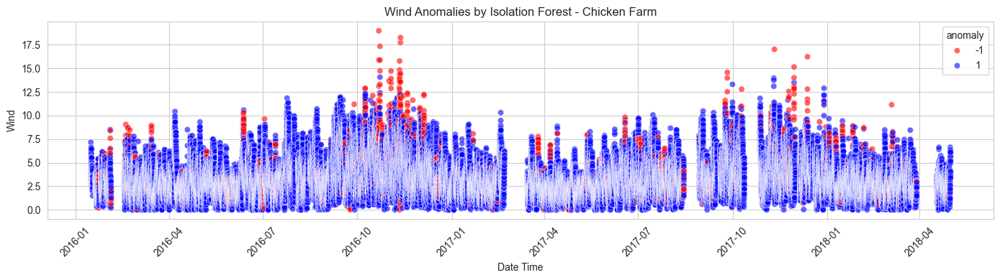

C:\Users\Shivm\AppData\Local\Temp\ipykernel_15960\3473282360.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_plot = df_cleaned[df_filtered['Location'] == loc]


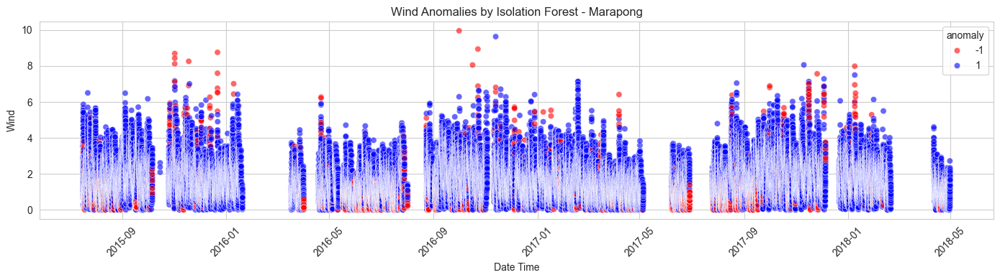

C:\Users\Shivm\AppData\Local\Temp\ipykernel_15960\3473282360.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_plot = df_cleaned[df_filtered['Location'] == loc]


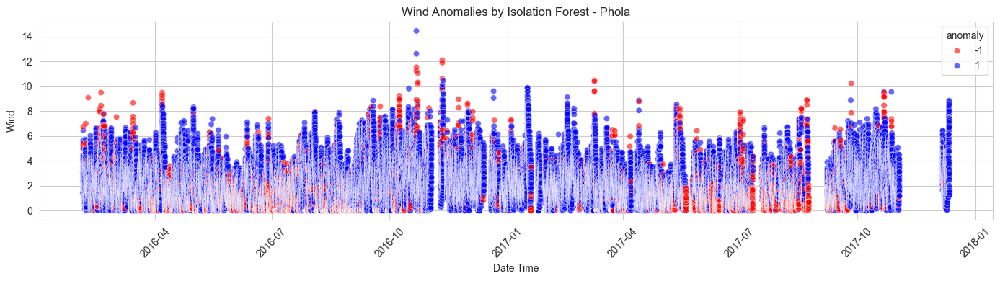

C:\Users\Shivm\AppData\Local\Temp\ipykernel_15960\3473282360.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_plot = df_cleaned[df_filtered['Location'] == loc]
c:\Users\Shivm\Documents\Masters\.venv\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


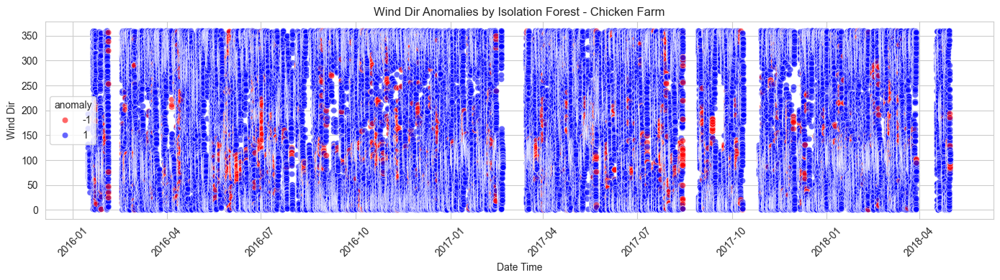

C:\Users\Shivm\AppData\Local\Temp\ipykernel_15960\3473282360.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_plot = df_cleaned[df_filtered['Location'] == loc]


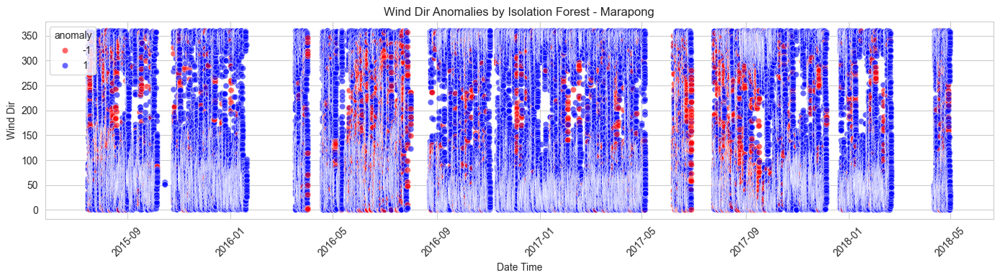

C:\Users\Shivm\AppData\Local\Temp\ipykernel_15960\3473282360.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_plot = df_cleaned[df_filtered['Location'] == loc]


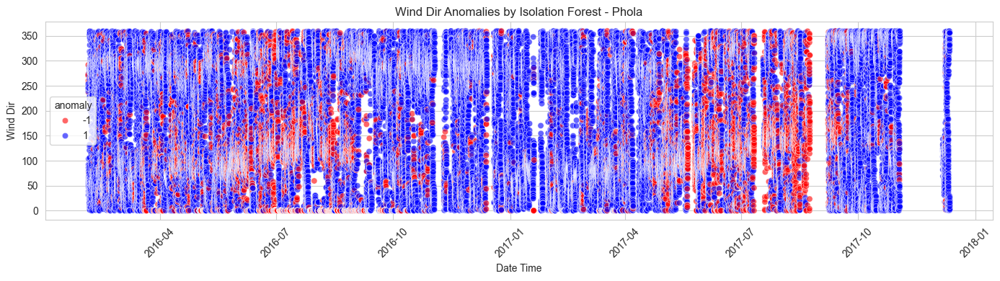

C:\Users\Shivm\AppData\Local\Temp\ipykernel_15960\3473282360.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_plot = df_cleaned[df_filtered['Location'] == loc]


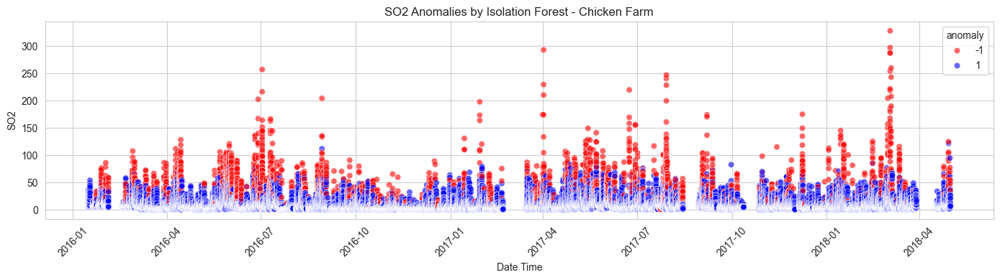

C:\Users\Shivm\AppData\Local\Temp\ipykernel_15960\3473282360.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_plot = df_cleaned[df_filtered['Location'] == loc]


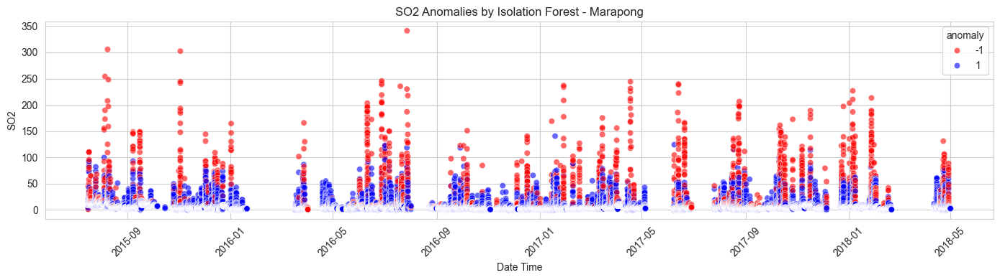

C:\Users\Shivm\AppData\Local\Temp\ipykernel_15960\3473282360.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_plot = df_cleaned[df_filtered['Location'] == loc]


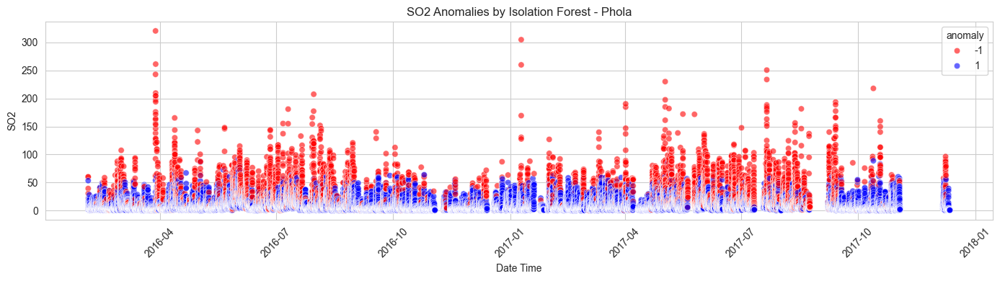

C:\Users\Shivm\AppData\Local\Temp\ipykernel_15960\3473282360.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_plot = df_cleaned[df_filtered['Location'] == loc]


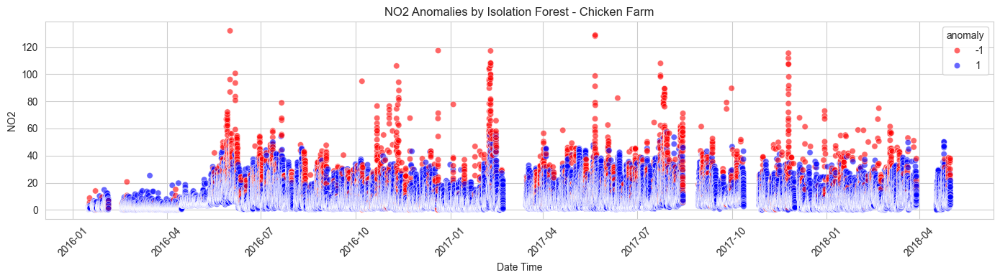

C:\Users\Shivm\AppData\Local\Temp\ipykernel_15960\3473282360.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_plot = df_cleaned[df_filtered['Location'] == loc]


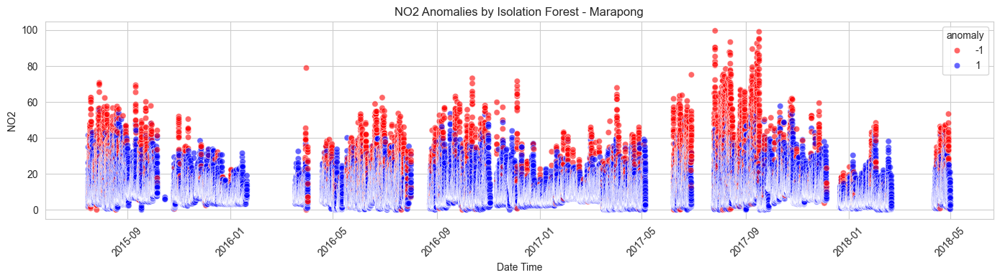

C:\Users\Shivm\AppData\Local\Temp\ipykernel_15960\3473282360.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_plot = df_cleaned[df_filtered['Location'] == loc]


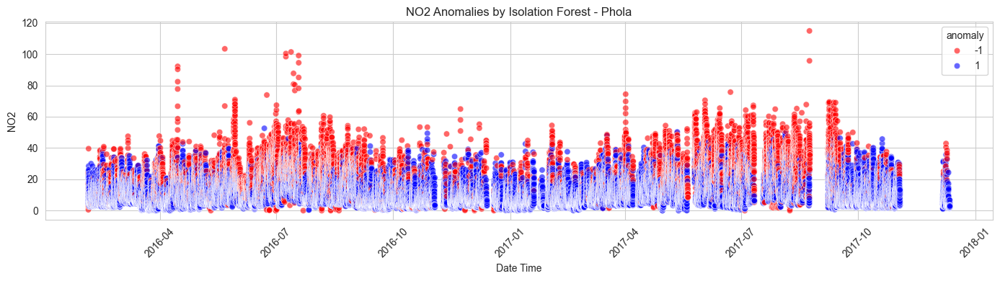

C:\Users\Shivm\AppData\Local\Temp\ipykernel_15960\3473282360.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_plot = df_cleaned[df_filtered['Location'] == loc]


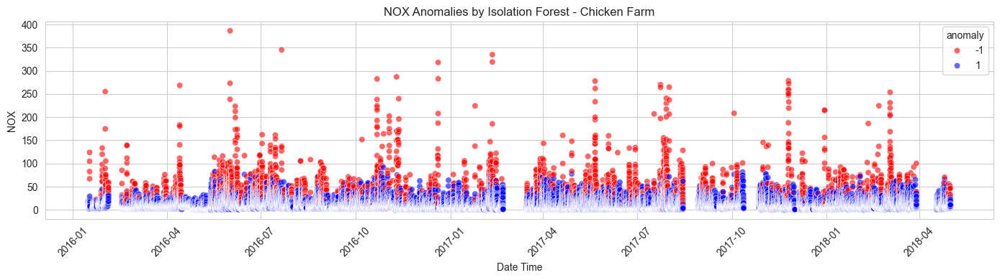

C:\Users\Shivm\AppData\Local\Temp\ipykernel_15960\3473282360.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_plot = df_cleaned[df_filtered['Location'] == loc]


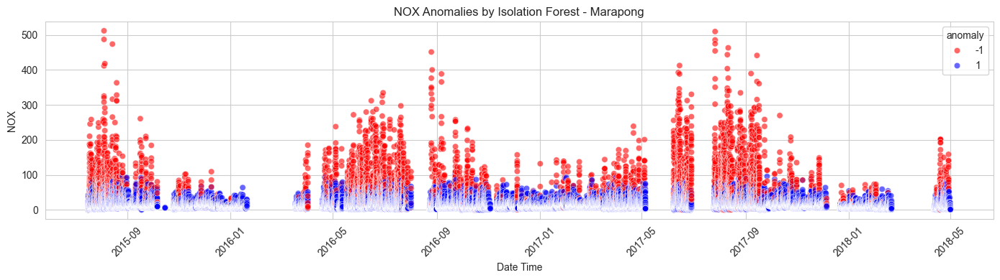

C:\Users\Shivm\AppData\Local\Temp\ipykernel_15960\3473282360.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_plot = df_cleaned[df_filtered['Location'] == loc]


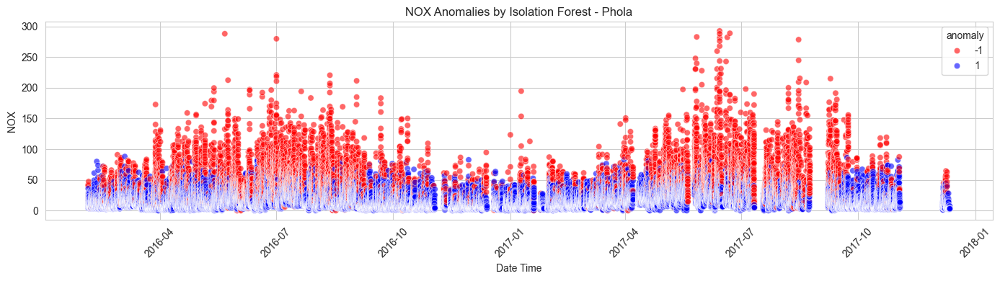

C:\Users\Shivm\AppData\Local\Temp\ipykernel_15960\3473282360.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_plot = df_cleaned[df_filtered['Location'] == loc]


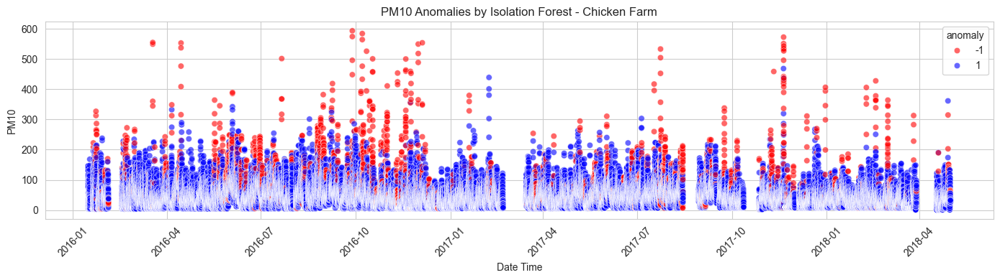

C:\Users\Shivm\AppData\Local\Temp\ipykernel_15960\3473282360.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_plot = df_cleaned[df_filtered['Location'] == loc]


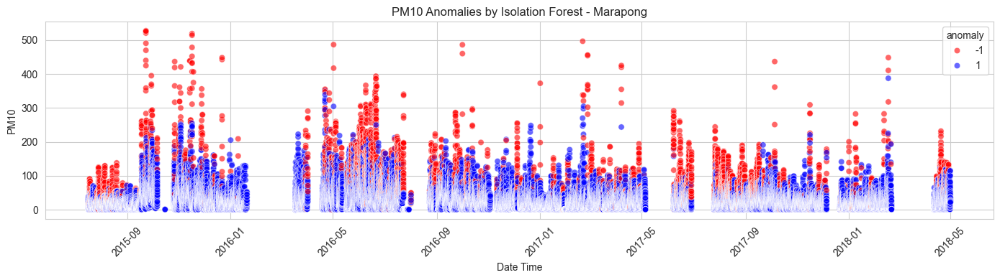

C:\Users\Shivm\AppData\Local\Temp\ipykernel_15960\3473282360.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_plot = df_cleaned[df_filtered['Location'] == loc]


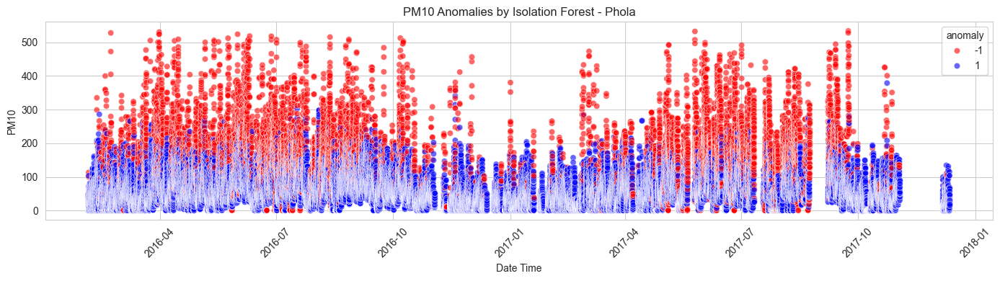

C:\Users\Shivm\AppData\Local\Temp\ipykernel_15960\3473282360.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_plot = df_cleaned[df_filtered['Location'] == loc]


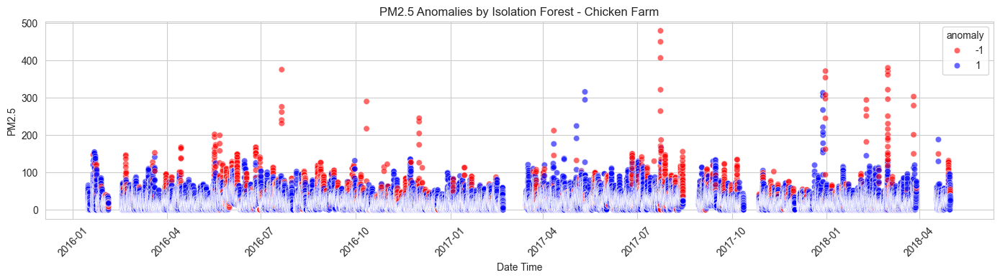

C:\Users\Shivm\AppData\Local\Temp\ipykernel_15960\3473282360.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_plot = df_cleaned[df_filtered['Location'] == loc]


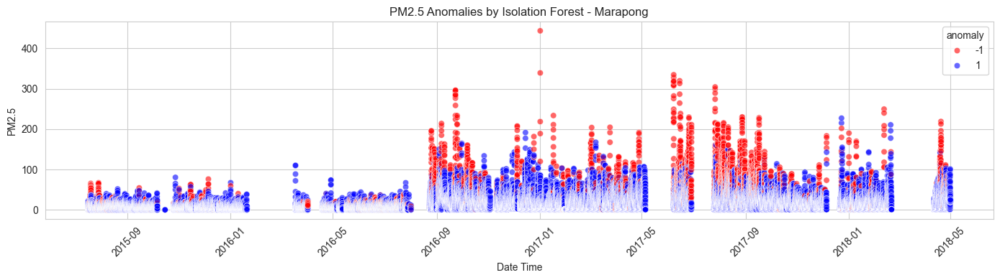

C:\Users\Shivm\AppData\Local\Temp\ipykernel_15960\3473282360.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_plot = df_cleaned[df_filtered['Location'] == loc]


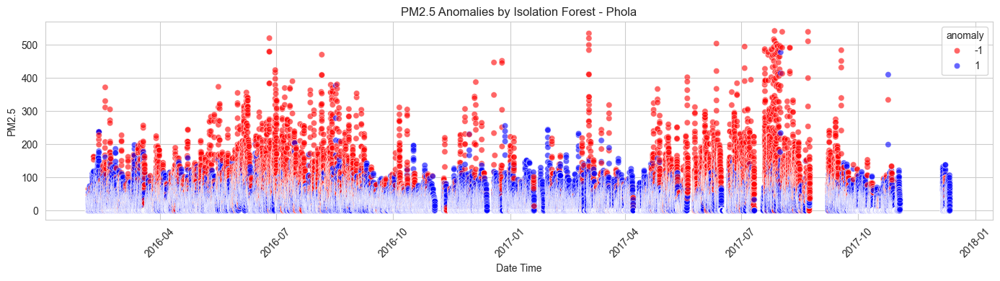

C:\Users\Shivm\AppData\Local\Temp\ipykernel_15960\3473282360.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_plot = df_cleaned[df_filtered['Location'] == loc]


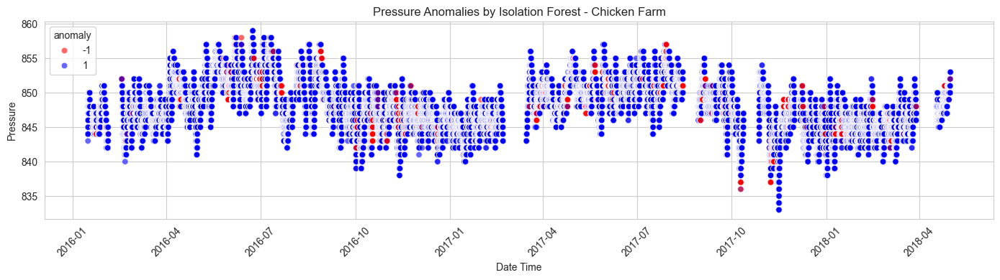

C:\Users\Shivm\AppData\Local\Temp\ipykernel_15960\3473282360.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_plot = df_cleaned[df_filtered['Location'] == loc]


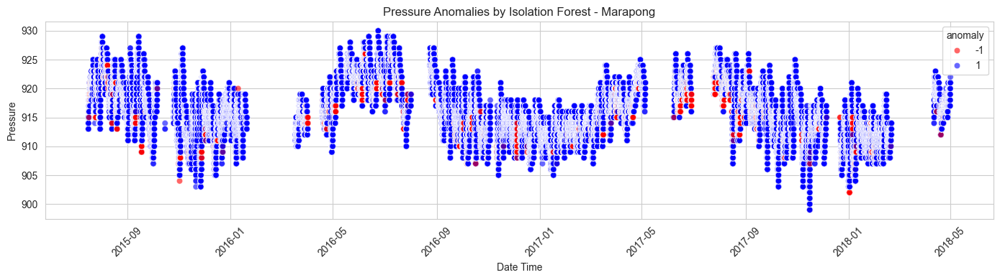

C:\Users\Shivm\AppData\Local\Temp\ipykernel_15960\3473282360.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_plot = df_cleaned[df_filtered['Location'] == loc]


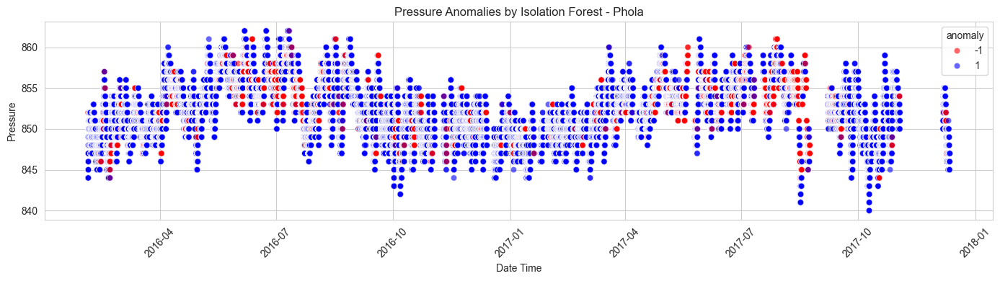

C:\Users\Shivm\AppData\Local\Temp\ipykernel_15960\3473282360.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_plot = df_cleaned[df_filtered['Location'] == loc]


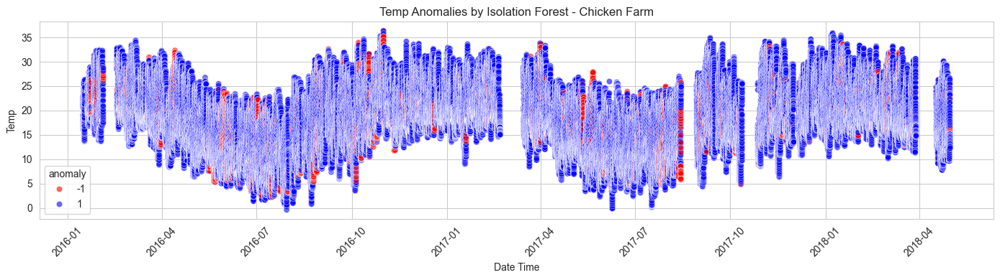

C:\Users\Shivm\AppData\Local\Temp\ipykernel_15960\3473282360.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_plot = df_cleaned[df_filtered['Location'] == loc]


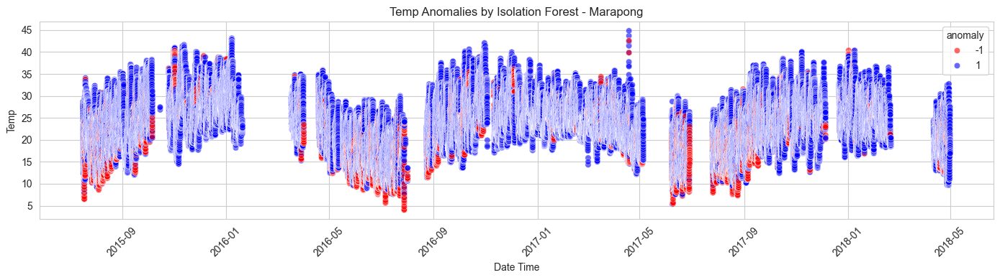

C:\Users\Shivm\AppData\Local\Temp\ipykernel_15960\3473282360.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_plot = df_cleaned[df_filtered['Location'] == loc]


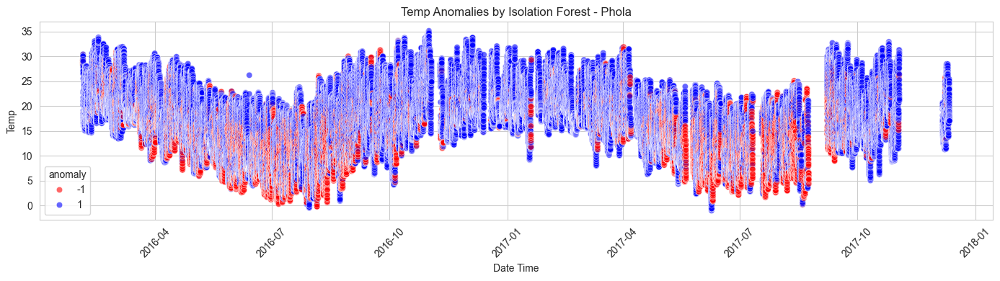

C:\Users\Shivm\AppData\Local\Temp\ipykernel_15960\3473282360.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_plot = df_cleaned[df_filtered['Location'] == loc]


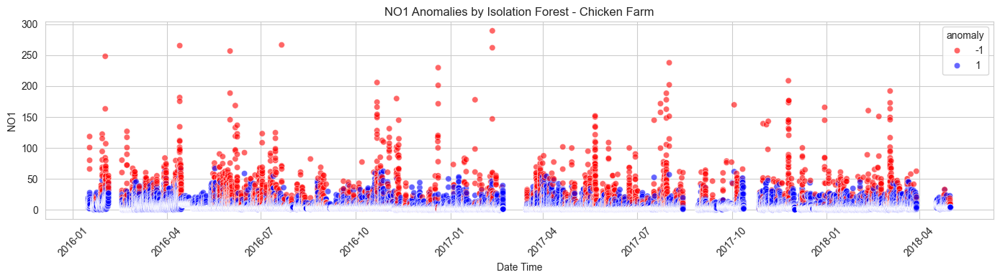

C:\Users\Shivm\AppData\Local\Temp\ipykernel_15960\3473282360.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_plot = df_cleaned[df_filtered['Location'] == loc]


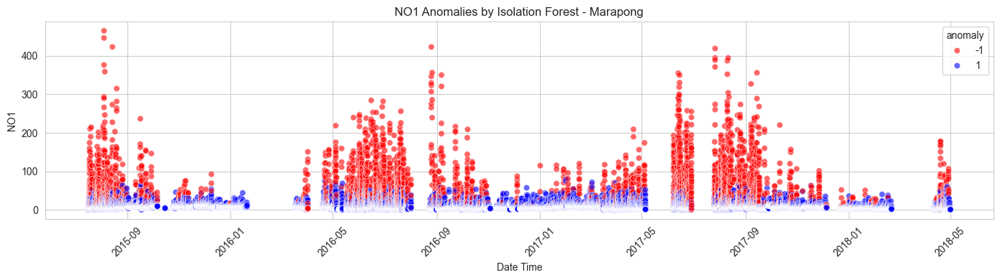

C:\Users\Shivm\AppData\Local\Temp\ipykernel_15960\3473282360.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_plot = df_cleaned[df_filtered['Location'] == loc]


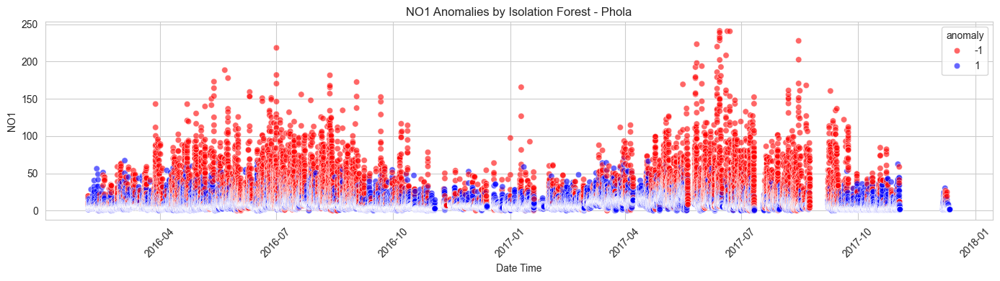

In [36]:
pollutants_to_plot = features
location_column = 'Location' if 'Location' in df_filtered.columns else None
locations = df_filtered['Location'].unique() if location_column else ['All']

for pollutant in pollutants_to_plot:
    for loc in locations:
        # Filter by location
        if location_column:
            df_plot = df_cleaned[df_filtered['Location'] == loc]
        else:
            df_plot = df_cleaned

        # Only plot if column exists
        if pollutant in df_plot.columns:
            plt.figure(figsize=(14, 4))
            sns.scatterplot(
                data=df_plot,
                x='Date Time',
                y=pollutant,
                hue='anomaly',
                palette={1: 'blue', -1: 'red'},
                alpha=0.6
            )
            plt.title(f"{pollutant} Anomalies by Isolation Forest - {loc}")
            plt.xlabel("Date Time")
            plt.ylabel(pollutant)
            plt.xticks(rotation=45)
            plt.tight_layout()
            plt.show()




In [177]:
df_cleaned.describe()

,Date Time,SO2 ppb,NO2 ppb,NO ppb,O3 ppb,CO ppb,PM2.5 µg/m3,PM10 µg/m3,Amb Wspeed m/s,Amb Wdirection Deg,Amb Temp C°,Solar Rad watt/m2,Hour,Month,DayOfWeek,SO2 ppb_lag1,NO2 ppb_lag1,NO ppb_lag1,O3 ppb_lag1,CO ppb_lag1,PM2.5 µg/m3_lag1,PM10 µg/m3_lag1,Amb Wspeed m/s_lag1,Amb Wdirection Deg_lag1,Amb Temp C°_lag1,Solar Rad watt/m2_lag1,SO2 ppb_roll3_mean,SO2 ppb_roll3_std,SO2 ppb_roll6_mean,SO2 ppb_roll6_std,SO2 ppb_roll12_mean,SO2 ppb_roll12_std,SO2 ppb_roll24_mean,SO2 ppb_roll24_std,NO2 ppb_roll3_mean,NO2 ppb_roll3_std,NO2 ppb_roll6_mean,NO2 ppb_roll6_std,NO2 ppb_roll12_mean,NO2 ppb_roll12_std,NO2 ppb_roll24_mean,NO2 ppb_roll24_std,NO ppb_roll3_mean,NO ppb_roll3_std,NO ppb_roll6_mean,NO ppb_roll6_std,NO ppb_roll12_mean,NO ppb_roll12_std,NO ppb_roll24_mean,NO ppb_roll24_std,O3 ppb_roll3_mean,O3 ppb_roll3_std,O3 ppb_roll6_mean,O3 ppb_roll6_std,O3 ppb_roll12_mean,O3 ppb_roll12_std,O3 ppb_roll24_mean,O3 ppb_roll24_std,CO ppb_roll3_mean,CO ppb_roll3_std,CO ppb_roll6_mean,CO ppb_roll6_std,CO ppb_roll12_mean,CO ppb_roll12_std,CO ppb_roll24_mean,CO ppb_roll24_std,PM2.5 µg/m3_roll3_mean,PM2.5 µg/m3_roll3_std,PM2.5 µg/m3_roll6_mean,PM2.5 µg/m3_roll6_std,PM2.5 µg/m3_roll12_mean,PM2.5 µg/m3_roll12_std,PM2.5 µg/m3_roll24_mean,PM2.5 µg/m3_roll24_std,PM10 µg/m3_roll3_mean,PM10 µg/m3_roll3_std,PM10 µg/m3_roll6_mean,PM10 µg/m3_roll6_std,PM10 µg/m3_roll12_mean,PM10 µg/m3_roll12_std,PM10 µg/m3_roll24_mean,PM10 µg/m3_roll24_std,Amb Wspeed m/s_roll3_mean,Amb Wspeed m/s_roll3_std,Amb Wspeed m/s_roll6_mean,Amb Wspeed m/s_roll6_std,Amb Wspeed m/s_roll12_mean,Amb Wspeed m/s_roll12_std,Amb Wspeed m/s_roll24_mean,Amb Wspeed m/s_roll24_std,Amb Wdirection Deg_roll3_mean,Amb Wdirection Deg_roll3_std,Amb Wdirection Deg_roll6_mean,Amb Wdirection Deg_roll6_std,Amb Wdirection Deg_roll12_mean,Amb Wdirection Deg_roll12_std,Amb Wdirection Deg_roll24_mean,Amb Wdirection Deg_roll24_std,Amb Temp C°_roll3_mean,Amb Temp C°_roll3_std,Amb Temp C°_roll6_mean,Amb Temp C°_roll6_std,Amb Temp C°_roll12_mean,Amb Temp C°_roll12_std,Amb Temp C°_roll24_mean,Amb Temp C°_roll24_std,Solar Rad watt/m2_roll3_mean,Solar Rad watt/m2_roll3_std,Solar Rad watt/m2_roll6_mean,Solar Rad watt/m2_roll6_std,Solar Rad watt/m2_roll12_mean,Solar Rad watt/m2_roll12_std,Solar Rad watt/m2_roll24_mean,Solar Rad watt/m2_roll24_std,PM2.5_target_t_plus_24,anomaly
count,163960,163960.000000,163960.000000,163960.000000,163960.000000,163960.000000,163960.000000,163960.000000,163960.000000,163960.000000,163960.000000,163960.000000,163960.000000,163960.000000,163960.000000,163960.000000,163960.000000,163960.000000,163960.000000,163960.000000,163960.000000,163960.000000,163960.000000,163960.000000,163960.000000,163960.000000,163960.000000,163960.000000,163960.000000,163960.000000,163960.000000,163960.000000,163960.000000,163960.000000,163960.000000,163960.000000,163960.000000,163960.000000,163960.000000,163960.000000,163960.000000,163960.000000,163960.000000,163960.000000,163960.000000,163960.000000,163960.000000,163960.000000,163960.000000,163960.000000,163960.000000,163960.000000,163960.000000,163960.000000,163960.000000,163960.000000,163960.000000,163960.000000,163960.000000,163960.000000,163960.000000,163960.000000,163960.000000,163960.000000,163960.000000,163960.000000,163960.000000,163960.000000,163960.000000,163960.000000,163960.000000,163960.000000,163960.000000,163960.000000,163960.000000,163960.000000,163960.000000,163960.000000,163960.000000,163960.000000,163960.000000,163960.000000,163960.000000,163960.000000,163960.000000,163960.000000,163960.000000,163960.000000,163960.000000,163960.000000,163960.000000,163960.000000,163960.000000,163960.000000,163960.000000,163960.000000,163960.000000,163960.000000,163960.000000,163960.000000,163960.000000,163960.000000,163960.000000,163960.000000,163960.000000,163960.000000,163960.000000,163960.000000,163960.000000,163960.000000,163960.000000,163960.000000,163960.000000,163960.000000,163960.000000,163960.000000
mean,2024-03-03 13:46:16.013661696,5.361913,11.0639

In [34]:
df_cleaned.to_csv('Combined Station Data.csv', index=False)

# Potential Algorithms to use:
## XGBoost: A tree based algorithm that is fast and can handle NaN or missing values. It can be used in regression and classification problems
## LightGBM: Very similar to XGBoost, can handle NaNs and is known to be faster and more memory efficient.
## Random Forrest: Decision Tree on steroids, however requires all NaNs to be addressed.